<a href="https://colab.research.google.com/github/thxsxth/POMDP_RLSepsis/blob/master/Analysis_of_Distributional_DQN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
cd 'drive/My Drive/sepsis3-cohort'


/content/drive/.shortcut-targets-by-id/1Dn0AjHyN50Kv8tcF0f2bQsdPbRYa_49h/sepsis3-cohort


In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
import torch
import numpy as np
import pandas as pd
import datetime as dt
import random
import time
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader
import torch.nn.functional as F
import os
import glob
import copy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device='cuda' if torch.cuda.is_available() else 'cpu'
print('Done')


Done


In [5]:
df=pd.read_csv('RL_corrected.csv')
# df=df.iloc[:,:-1]
print('Loaded')
df['SOFA_']=df.SOFA
df['SV_']=df.SV
df['SV_C']=(df.SV_/df.C)

Loaded


In [ ]:
df['SV_C']=(df['SV_C']-df['SV_C'].mean())/(df['SV_C'].std())

In [ ]:
act_df=pd.read_csv('dBCQ/scratch_NOV/dist/actions.csv')
for col in ['dist_Vaso','dist_Fluids']:
  df[col]=act_df[col]

df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids
0,46.0,118.0,62.0,26.0,0.0,94.0,109.0,36.388889,0.0,0.0,0.0,0.0,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,65.685165,82.0,0.0,75.1,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,2
1,41.0,111.0,58.0,23.0,2.0,95.0,109.0,36.388889,1.0,0.0,0.0,1.0,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,66.568794,82.0,0.0,75.1,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,2
2,44.0,108.0,62.0,19.0,5.0,98.0,118.0,36.388889,1.0,0.0,0.0,4.0,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,66.941925,82.0,0.0,75.1,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,1
3,41.0,96.0,60.0,20.0,5.0,96.0,118.0,36.388889,1.0,0.0,0.0,4.0,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,68.092636,82.0,0.0,75.1,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,1
4,46.0,95.0,65.0,20.0,5.0,93.0,124.0,36.388889,1.0,0.0,0.0,4.0,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,68.271576,82.0,0.0,75.1,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,1


### Normalize some columns

In [6]:
temp=df.describe()
means=temp.loc['mean'].values
stds=temp.loc['std'].values

cols=[0,1,2,3,4,5,6,7,11,37,38,40]

df.iloc[:,cols]=(df.iloc[:,cols]-means[cols])/stds[cols]
print('Normalized')

Normalized


In [ ]:
means

array([ 5.97680844e+01,  8.65268912e+01,  7.86168041e+01,  2.06791009e+01,
        6.44170886e+00,  9.71415643e+01,  1.21511315e+02,  3.69600955e+01,
        1.21276598e+00,  2.09433591e+00,  3.81532571e-01,  1.30679688e+00,
       -1.32587129e-01,  2.47033868e-02,  3.43234954e-03,  1.89323164e-01,
       -2.30669752e-02, -1.20075913e-01, -1.81488828e-01, -1.22392416e-02,
       -6.37759038e-02,  1.61877502e-01,  1.45423881e-01,  1.12890419e-01,
        9.76008341e-02,  1.35763436e-01, -4.07678096e-01,  1.81965244e-01,
        1.58229578e-01, -5.26373330e-01, -5.83405959e-02,  1.75772221e-01,
        8.53373985e-02, -4.23018796e-02,  8.08761724e-01,  1.23542296e+00,
        6.42965810e-01,  6.87600413e+01,  6.53440726e+01,  5.84643249e-01,
        8.37737428e+01,  4.95818074e-02,  5.79818220e+01,  6.22244670e-02,
        2.50184230e+05,  4.44970816e-01,  1.01681465e+00,  3.24166873e+00])

In [ ]:
stds

array([1.41127915e+01, 1.71324684e+01, 1.60435516e+01, 6.04456389e+00,
       3.85008103e+00, 3.27706005e+00, 2.24704618e+01, 7.89101766e-01,
       1.10273039e+00, 1.36031177e+00, 9.51707717e-01, 1.50444278e+00,
       9.50887586e-01, 1.00413460e+00, 9.20852861e-01, 9.64146936e-01,
       6.96247963e-01, 8.04110624e-01, 8.04816858e-01, 9.55594122e-01,
       8.33892990e-01, 9.31975058e-01, 1.05610087e+00, 7.95282991e-01,
       4.27973302e-01, 4.14742445e-01, 3.36382760e-01, 3.68723800e-01,
       3.75602683e-01, 3.37196671e-01, 3.53584285e-01, 3.66109995e-01,
       4.22208406e-01, 3.53814500e-01, 2.02588617e-01, 4.17686047e-01,
       1.34842540e-01, 1.65489857e+00, 1.58998495e+01, 4.92783537e-01,
       2.59243694e+01, 2.13275699e-01, 6.90923635e+02, 1.26622855e+00,
       2.85776138e+04])

In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,Vaso_cuts,Fluid_cuts,action
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0,0,0
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,0,0,0
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0


In [7]:
def get_actions(df):
  df['Fluids']=df['Fluids'].apply(lambda x:max(x,0))
  Vaso_cuts,vaso_bins=pd.cut(df['Vaso'],bins=[-1e-6,1e-8/2,0.15,np.inf],labels=False,retbins=True)

  df['Vaso_cuts']=Vaso_cuts.values
  Fluids_cuts,fluid_bins=pd.cut(df['Fluids'],bins=[-1e-6,6.000000e-03/2,5.000000e+01,np.inf],labels=False,retbins=True)

  df['Fluid_cuts']=Fluids_cuts.values
  df['Fluid_cuts'].value_counts(normalize=True),df['Vaso_cuts'].value_counts(normalize=True)

  all_acts=np.arange(9).reshape(3,3)


  df['action']=all_acts[df.Vaso_cuts,df.Fluid_cuts]


get_actions(df)

### Data set class for Discrete RL

In [8]:
class Discrete_RL_dataset(Dataset):
  """
   Need the df Ready and scaled
   Normalization is Done before

  """

  def __init__(self,scale_rewards=False,df_=df):
    self.scale_rewards=scale_rewards
    self.df=df_

  def __len__(self):
    return self.df.shape[0]

  def __getitem__(self,idx):
    
    assert idx<=self.df.shape[0]-1
    temp=self.df.iloc[idx,:]
    # Rewards is always +- 15 at the terminal step and 
    done=int(np.abs(temp['Rewards'])==15)
    states=torch.FloatTensor(temp.iloc[:41].values).to(device)
    
    assert states.shape==(41,)
    if done:
      next_states=torch.zeros_like(states).to(device)
    
    else:
      next_states=torch.FloatTensor(self.df.iloc[idx+1,:].values[:41]).to(device)

    assert next_states.shape==(41,)

    reward=temp['Rewards']
    
    if self.scale_rewards:
      reward=(rewards-2.313230e-02)/9.304778e-01
    
    action=int(temp.action)

    # assert actions.shape==(2,)

    return states,next_states,action,reward,done

ds=Discrete_RL_dataset()
loader=DataLoader(ds,batch_size=64*2,shuffle=True)    

## Distributional

In [9]:

class DistributionalDQN(nn.Module):
    def __init__(self, state_dim, n_actions, N_ATOMS):
        super(DistributionalDQN, self).__init__()

        self.input_layer=nn.Linear(state_dim,512)
        self.n_atoms=N_ATOMS
        self.hiddens=nn.ModuleList([ nn.Sequential(
            nn.Linear(512, 512),
            nn.ReLU()) for _ in range(5) ])
        
       
        self.out=nn.Linear(512, n_actions * N_ATOMS)
       
  

    def forward(self, state):
        batch_size =state.size()[0]
        out=self.input_layer(state)

        for layer in self.hiddens:
          out=layer(out)
        
        out=self.out(out)
        
        return F.softmax(out.view(batch_size, -1, self.n_atoms),dim=2),F.log_softmax(out.view(batch_size, -1,self.n_atoms), dim = -1)


In [10]:
class dist_DQN(object):
  def __init__(self,
               num_actions=9,
               state_dim=41,
               v_max=15,
               v_min=-15,
               device='cpu',
               gamma=0.999,
               tau=0.005,
               n_atoms=51
               ):
    self.device=device
    self.Q =DistributionalDQN(state_dim, num_actions,n_atoms).to(self.device)
    self.Q_target=copy.deepcopy(self.Q)
    self.optimizer=torch.optim.Adam(self.Q.parameters(),lr=1e-4)

    self.tau = tau
    self.gamma=gamma
    self.v_min=v_min
    self.v_max=v_max

    self.num_actions = num_actions
    self.atoms=n_atoms
    self.supports = torch.linspace(self.v_min, self.v_max, self.atoms).view(1, 1, self.atoms).to(self.device)
    self.delta = (self.v_max - self.v_min) / (self.atoms - 1)



  def train_epoch(self,data_loader,it=0):

    sum_q_loss=0
    for i,(state,next_state,action,reward,done) in enumerate(data_loader):

      batch_size=state.shape[0]
      action=torch.LongTensor(action.reshape(batch_size,1)).to(device)
      reward=torch.FloatTensor(reward.reshape(batch_size,1).cpu().numpy()).to(device)
      done=done.reshape(batch_size,1).to(device)

      batch=(state,next_state,action,reward,done)
      loss=self.compute_loss(batch)

      sum_q_loss+=loss.item()
       
	    
      if i%25==0:
        print('Epoch :',it,'Batch :', i,'Average Loss :',sum_q_loss/(i+1))


      self.optimizer.zero_grad()
      loss.backward()

      self.optimizer.step()
      self.polyak_target_update()


  def polyak_target_update(self):
     for param, target_param in zip(self.Q.parameters(), self.Q_target.parameters()):
        target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)


  def compute_loss(self,batch):

     state,next_state,action,reward,done=batch  
     batch_size=state.shape[0]
     range_batch = torch.arange(batch_size).long().to(device)
     action = action.long()

     z_dist = torch.from_numpy(np.array([[self.v_min + i*self.delta for i in range(self.atoms)]]*batch_size)).to(device)
     z_dist = torch.unsqueeze(z_dist, 2).float() 

     _, log_Q_dist_prediction = self.Q(state)
     log_Q_dist_prediction = log_Q_dist_prediction[range_batch, action.squeeze(1), :]

     with torch.no_grad():
        Q_dist_target, _ = self.Q_target(next_state)
 
     Q_target = torch.matmul(Q_dist_target, z_dist).squeeze(1)
     a_star = torch.argmax(Q_target, dim=1)
     Q_dist_star = Q_dist_target[range_batch, a_star.squeeze(1),:]

     m = torch.zeros(batch_size,self.atoms).to(device)

     for j in range(self.atoms):
         T_zj = torch.clamp(reward + self.gamma * (1-done) * (self.v_min + j*self.delta), min = self.v_min, max = self.v_max)
            
         bj = (T_zj - self.v_min)/self.delta
         l = bj.floor().long()
         u = bj.ceil().long()

         mask_Q_l = torch.zeros(m.size()).to(device)
         mask_Q_l.scatter_(1, l, Q_dist_star[:,j].unsqueeze(1))
            
         mask_Q_u = torch.zeros(m.size()).to(device)
         mask_Q_u.scatter_(1, u, Q_dist_star[:,j].unsqueeze(1))
         m += mask_Q_l*(u.float() + (l == u).float()-bj.float())
         m += mask_Q_u*(-l.float()+bj.float())

     loss = - torch.sum(torch.sum(torch.mul(log_Q_dist_prediction, m),-1),-1) / batch_size
     return loss


In [11]:
model=dist_DQN(v_max=18,v_min=-18)


In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,Vaso_cuts,Fluid_cuts,action
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0,0,0
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,0,0,0
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,0,0,0


In [ ]:
states,next_states,action,reward,done=next(iter(loader))

In [ ]:
Q,log_Q=model.Q(states)
Q1,log_Q1=model1.Q(states)

In [12]:
def load_model(model,PATH):
  checkpoint=torch.load(PATH)
  model.Q.load_state_dict(checkpoint['Q_state_dict'])

In [13]:
def get_losses(Q,logQ,logQ1):
  """
  Q should be the reference

  """
  kld=torch.sum(torch.mul(Q, logQ-logQ1),-1)
  cross=-torch.sum(torch.mul(Q, logQ1),-1)
  
  return cross,kld

In [14]:
load_model(model,'dBCQ/scratch_NOV/dist/dist_v2_2.pt')
# load_model(model1,'dist_bootstrap_0.pt')

In [15]:
def get_losses_from_loader(loader,model_base,model_2,k=0):
  ce=[]
  kl=[]
  for i,(batch) in enumerate(loader):
    with torch.no_grad():
      state=batch[0]
      Q,logQ=model_base.Q(state)
      Q1,logQ1=model_2.Q(state)
      cross,kld=get_losses(Q,logQ,logQ1)
    
    ce.append(cross.cpu().numpy())
    kl.append(kld.cpu().numpy())
    print('EPOCH :',k,i/(len(loader)),' DONe')
  return ce, kl

In [ ]:
ls 

### DOING ALL THE ANALYSIS

In [ ]:
filenames=['dist_bootstrap_{}.pt'.format(i) for i in range(29)]
# ce_losses=[]
# kl_divs=[]
for k in range(22,29):
  
  loader=DataLoader(ds,batch_size=128,shuffle=False,num_workers=4)
  model_new=dist_DQN(v_min=-18,v_max=18)
  
  load_model(model_new,filenames[k])
  ce_loss,kl_div=get_losses_from_loader(loader,model_base=model,model_2=model_new,k=k)
  kls=np.vstack(kl_div)
  kl_df=pd.DataFrame(kls)
  
  kl_df.to_csv('Boot_KLS_{}.csv'.format(k))
  
  ce_losses.append(ce_loss)
  kl_divs.append(kl_div)


EPOCH : 22 0.0  DONe
EPOCH : 22 4.929508035098097e-05  DONe
EPOCH : 22 9.859016070196194e-05  DONe
EPOCH : 22 0.0001478852410529429  DONe
EPOCH : 22 0.00019718032140392388  DONe
EPOCH : 22 0.00024647540175490486  DONe
EPOCH : 22 0.0002957704821058858  DONe
EPOCH : 22 0.0003450655624568668  DONe
EPOCH : 22 0.00039436064280784776  DONe
EPOCH : 22 0.00044365572315882877  DONe
EPOCH : 22 0.0004929508035098097  DONe
EPOCH : 22 0.0005422458838607907  DONe
EPOCH : 22 0.0005915409642117716  DONe
EPOCH : 22 0.0006408360445627527  DONe
EPOCH : 22 0.0006901311249137336  DONe
EPOCH : 22 0.0007394262052647146  DONe
EPOCH : 22 0.0007887212856156955  DONe
EPOCH : 22 0.0008380163659666765  DONe
EPOCH : 22 0.0008873114463176575  DONe
EPOCH : 22 0.0009366065266686385  DONe
EPOCH : 22 0.0009859016070196194  DONe
EPOCH : 22 0.0010351966873706005  DONe
EPOCH : 22 0.0010844917677215813  DONe
EPOCH : 22 0.0011337868480725624  DONe
EPOCH : 22 0.0011830819284235432  DONe
EPOCH : 22 0.0012323770087745243  DONe


In [ ]:
kl_df=pd.DataFrame(kls)
kl_df.to_csv('Boot_KLS_{}.csv'.format(k))


In [ ]:
kl=pd.read_csv('Boot_KLS_{}.csv'.format(2))

In [ ]:
kl=pd.read_csv('Boot_KLS_{}.csv'.format(0))
kl=kl.iloc[:,1:]
for k in range(1,22):
  kl1=pd.read_csv('Boot_KLS_{}.csv'.format(k))
  kl1=kl1.iloc[:,1:]
  kl=kl+kl1




In [ ]:
kl=kl/k

In [ ]:
kl.to_csv('avergae_KLs.csv',index=False)

In [ ]:
kl.describe()

,0,1,2,3,4,5,6,7,8
count,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06
mean,1.210628e-01,1.154771e-01,1.223204e-01,1.139530e-01,1.133243e-01,1.174757e-01,1.092918e-01,1.090862e-01,1.182607e-01
std,1.305651e-01,1.166242e-01,1.325781e-01,1.148613e-01,1.034015e-01,1.105341e-01,1.091153e-01,1.040500e-01,1.062049e-01
min,4.819455e-03,4.900003e-03,5.573712e-03,4.814132e-03,4.897309e-03,6.121382e-03,5.606451e-03,6.121594e-03,5.894517e-03
25%,6.075708e-02,5.976166e-02,6.180086e-02,5.815606e-02,5.963495e-02,6.206188e-02,5.613118e-02,5.673077e-02,6.231265e-02
50%,8.678252e-02,8.516771e-02,8.893995e-02,8.362279e-02,8.493705e-02,8.784228e-02,7.997468e-02,8.052936e-02,8.925553e-02
75%,1.310879e-01,1.280478e-01,1.347806e-01,1.271941e-01,1.277275e-01,1.310505e-01,1.205299e-01,1.209953e-01,1.342516e-01
max,5.883047e+00,5.260921e+00,6.085520e+00,5.276970e+00,4.261736e+00,4.318763e+00,5.238631e+00,4.135628e+00,4.234689e+00


In [ ]:
kl["SOFA"]=df.SOFA

In [ ]:
ls dBCQ/scratch_NOV/dist

actions2.csv        dist_17_atoms_4.pt  dist_v2_2.pt  dist_v2_7.pt
actions.csv         dist_17_atoms_5.pt  dist_v2_3.pt  dist_v2_8.pt
dist_17_atoms_1.pt  dist_v2_0.pt        dist_v2_4.pt  dist_v2_9.pt
dist_17_atoms_2.pt  dist_v2_10.pt       dist_v2_5.pt  images/
dist_17_atoms_3.pt  dist_v2_11.pt       dist_v2_6.pt


### Analyszing Actions + Value Functions

In [ ]:
import matplotlib.pyplot as plt

def plot_feature_treat(pat,df=df,feature='SBP'):
  cols
  legends = ['Fluids for the Patient', 'Standardized {}'.format(feature),'Mean {}'.format(feature),'Vaso for the patient']
             
    
  plt.figure(figsize=(10,10))
  pat_df=df[df.Pat==pat]

  treat=pat_df.dist_Fluids.values
  vaso=pat_df.dist_Vaso.values

  plt.plot(np.arange(treat.shape[0]),treat,'r',linestyle='dotted',linewidth=0.05,label=legends[0],marker=".",markersize=5)
  plt.plot(np.arange(vaso.shape[0]),vaso,'b',linestyle='dotted',linewidth=0.5,label=legends[3],marker=".",markersize=5)
  
  plt.plot(np.arange(treat.shape[0]),pat_df[feature].values,'g',linestyle=':',linewidth=1,marker='*',label=legends[1])
  
  
   
  plt.hlines(df[feature].mean(),0,(pat_df.shape[0]),'k',label=legends[2])
  
  plt.legend()


In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,2,0,0,0
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,2,0,0,0
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,1,0,0,0
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,1,0,0,0
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,1,0,0,0


In [ ]:
import matplotlib.pyplot as plt
def plot_feature_CV(pat,df=df):
  cols
  legends = ['Fluids for the Patient', 'RC','SV/C','Vaso for the patient']
             
    
  plt.figure(figsize=(15,15))
  pat_df=df[df.Pat==pat]

  treat=pat_df.dist_Fluids.values
  vaso=pat_df.dist_Vaso.values
  
  RC=pat_df.R*pat_df.C
  SVC=pat_df.SV_C

  plt.plot(np.arange(RC.shape[0]),treat,'r',linestyle='dotted',linewidth=0.05,label=legends[0],marker=".",markersize=5)
  plt.plot(np.arange(SVC.shape[0]),vaso,'b',linestyle='dotted',linewidth=0.5,label=legends[3],marker=".",markersize=5)
  
  plt.plot(np.arange(treat.shape[0]),RC.values,'g',linestyle=':',linewidth=1,marker='*',label='RC')
  plt.hlines((df['R']*df['C']).mean(),0,(pat_df.shape[0]),'k',label='Mean RC')
  plt.plot(np.arange(treat.shape[0]),SVC.values,'c',linestyle=':',linewidth=1,marker='*',label='Standardized SV/C')
  plt.hlines(df['SV_C'].mean(),0,(pat_df.shape[0]),'y',label='Mean Standardized SV/C')
  
  
  plt.legend()
  plt.show()


263157


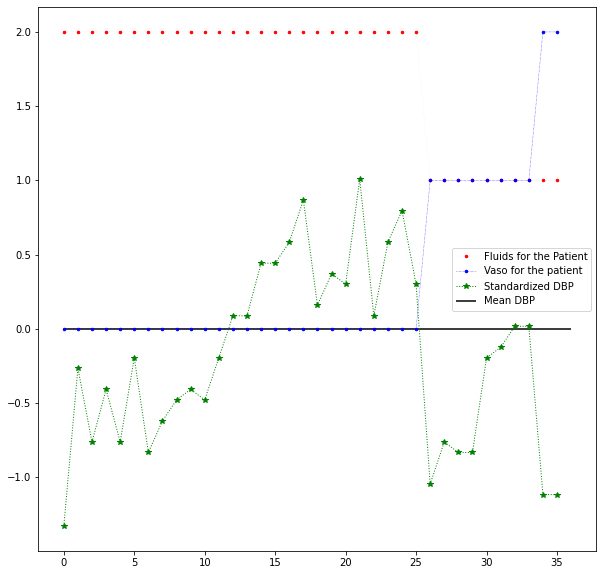

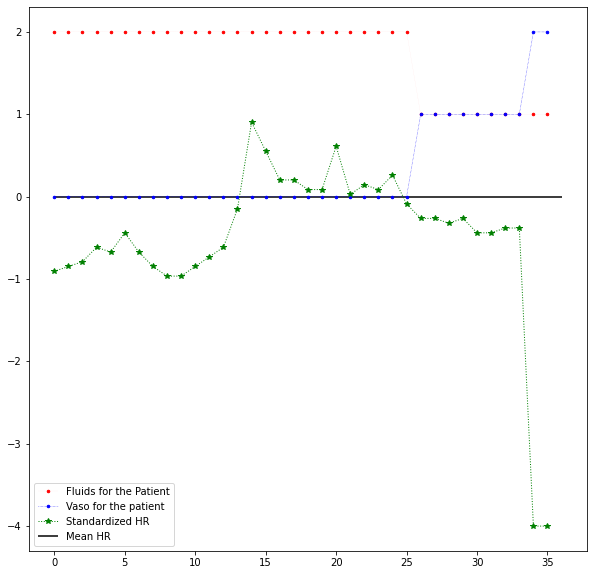

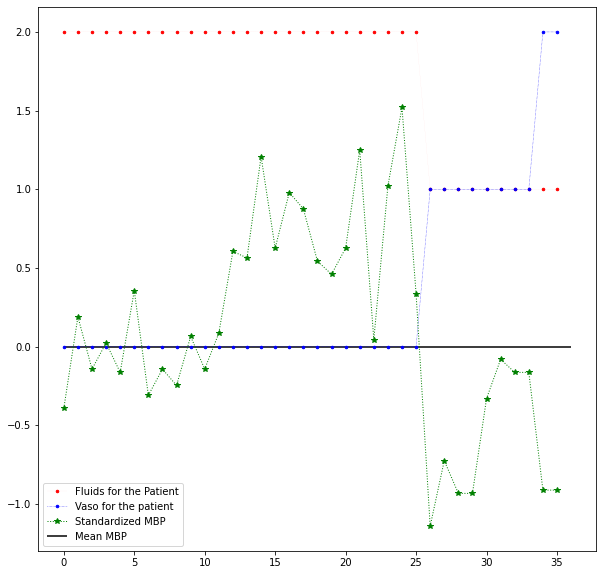

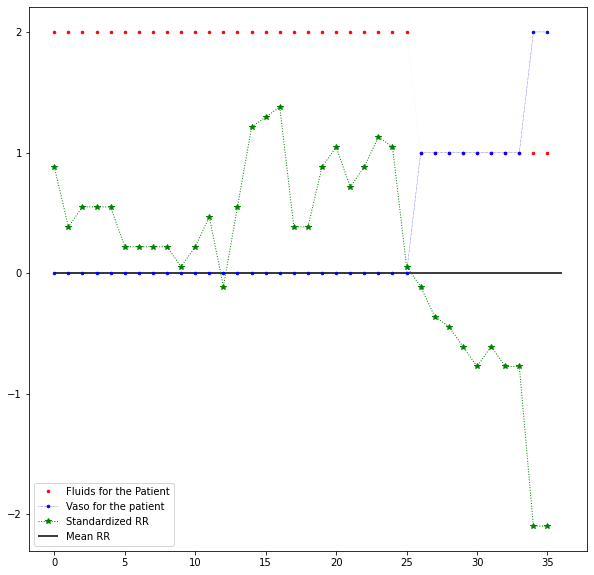

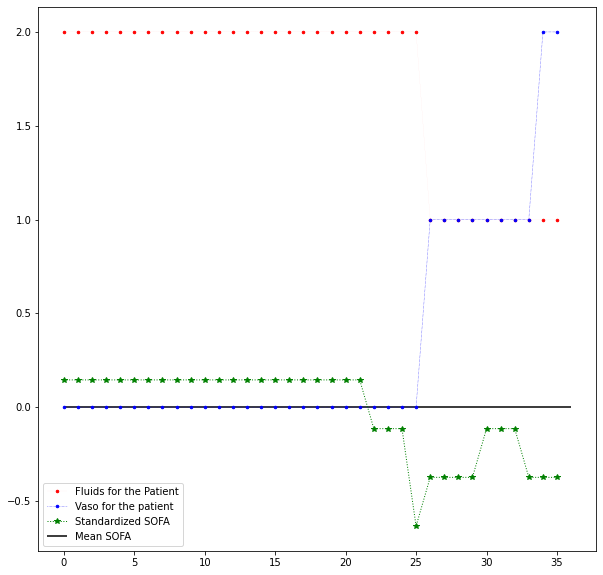

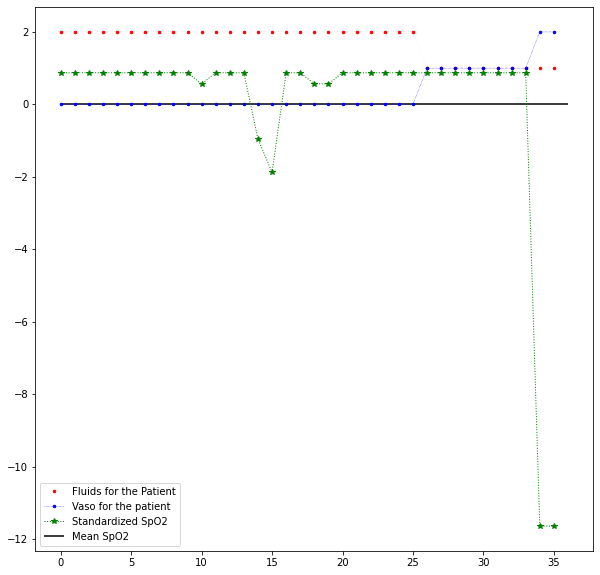

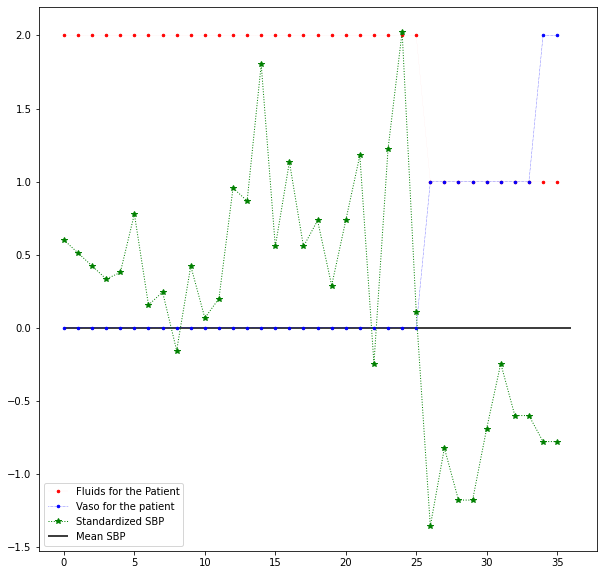

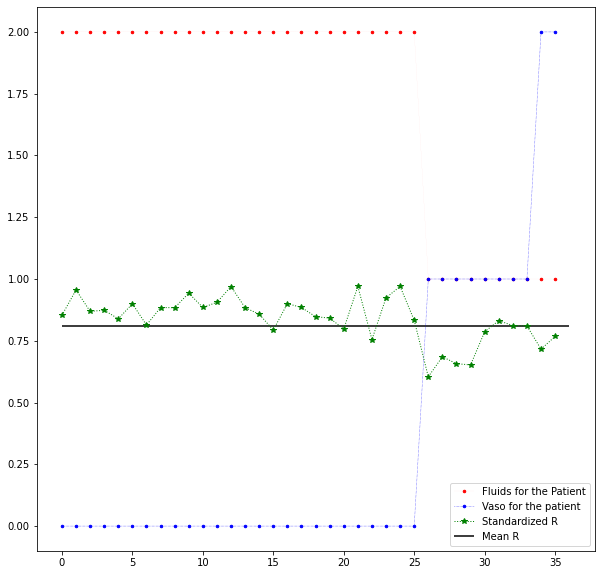

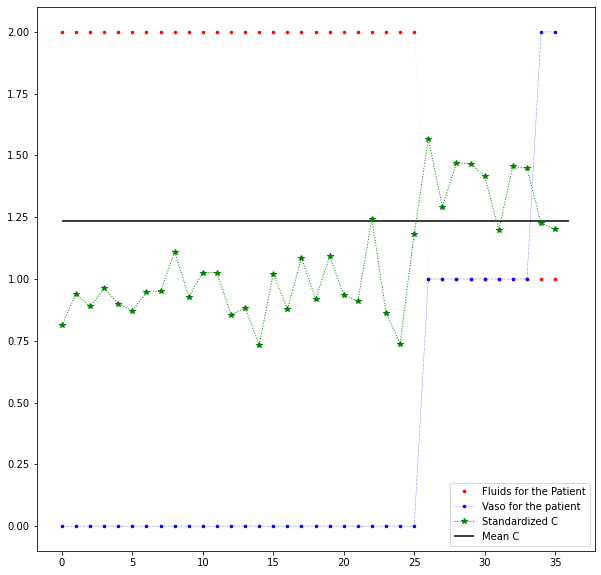

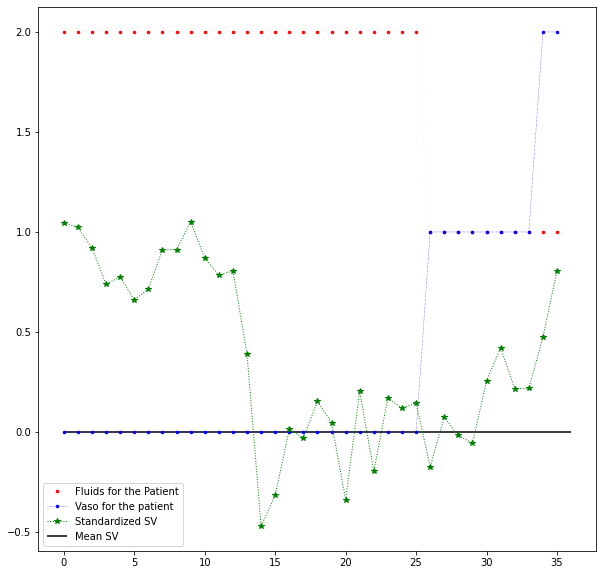

In [ ]:
# dead_pats=list(df[df.Rewards==-15].Pat)
print(pat)
# pat=np.random.choice(dead_pats)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV'.split():
  plot_feature_treat(pat,feature=feat)

ICU ID : 223602


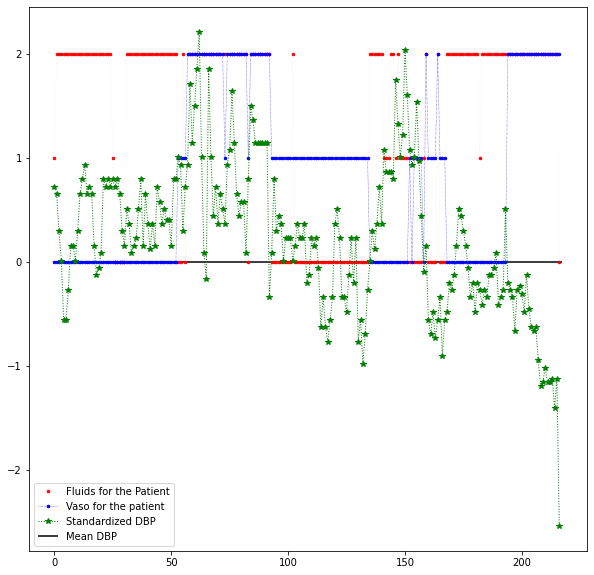

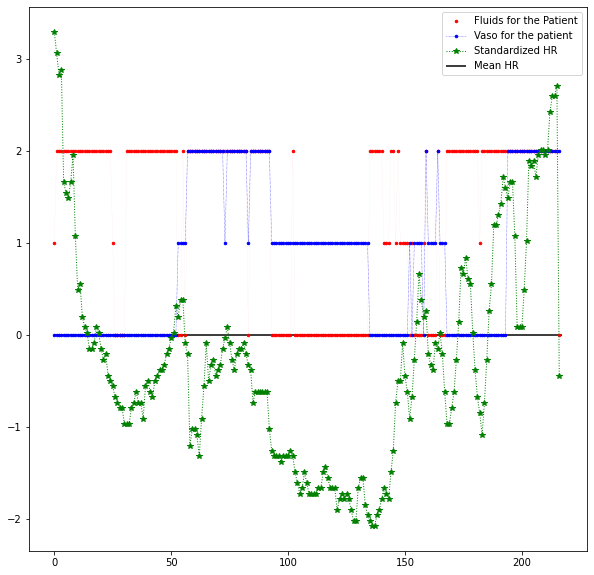

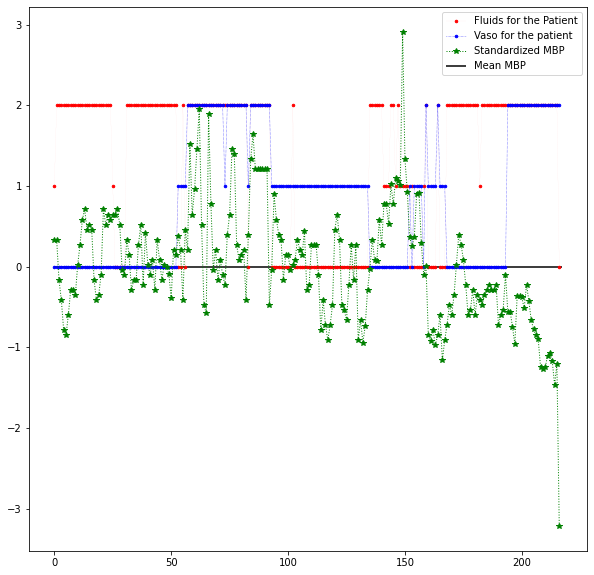

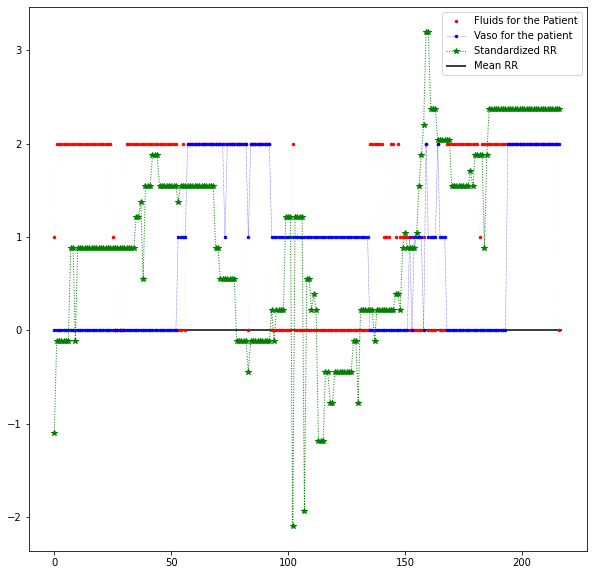

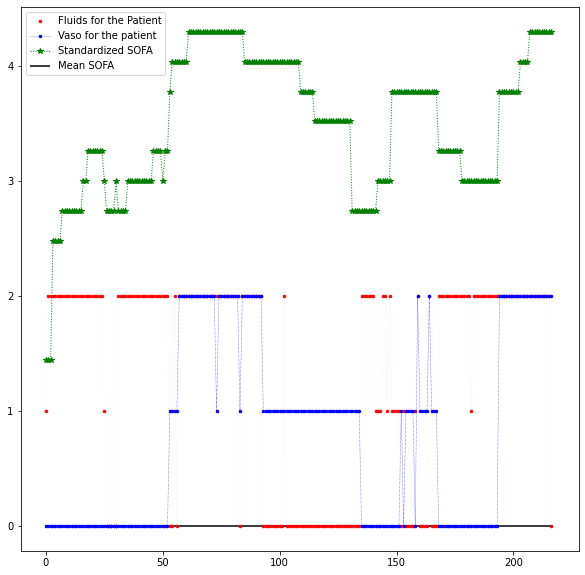

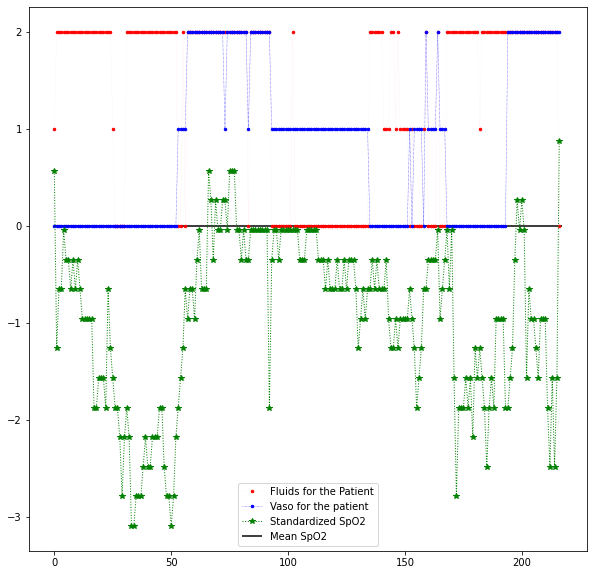

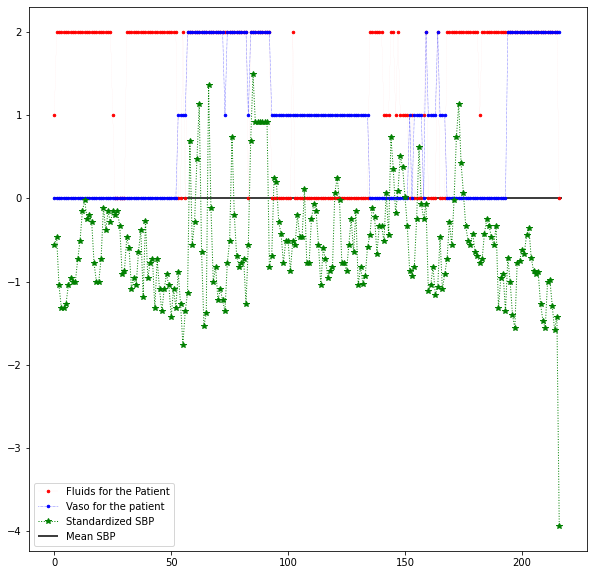

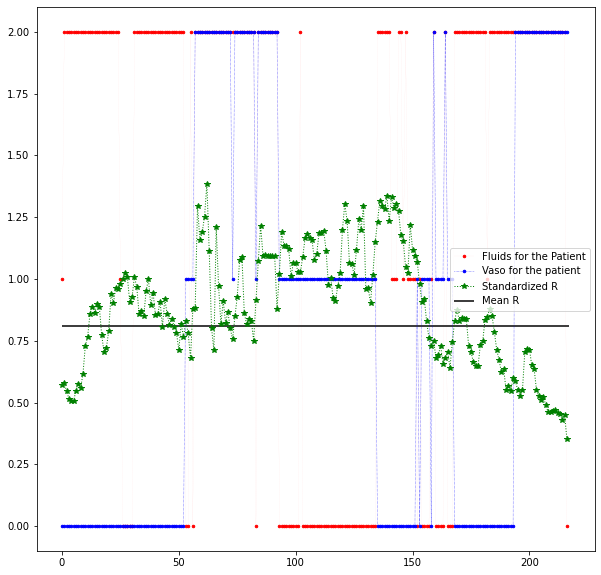

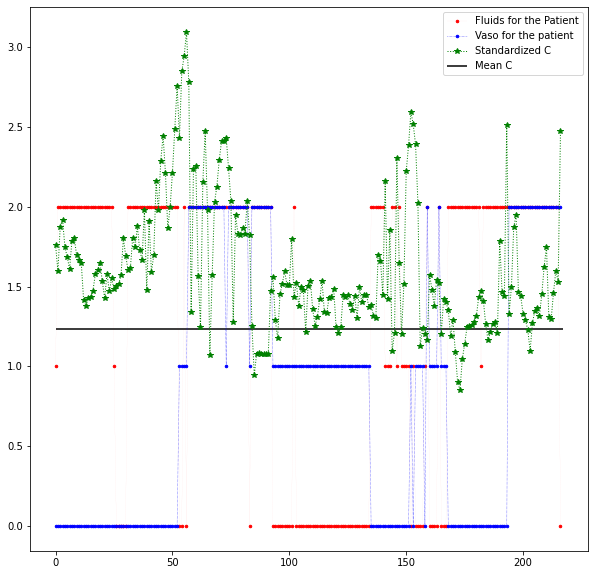

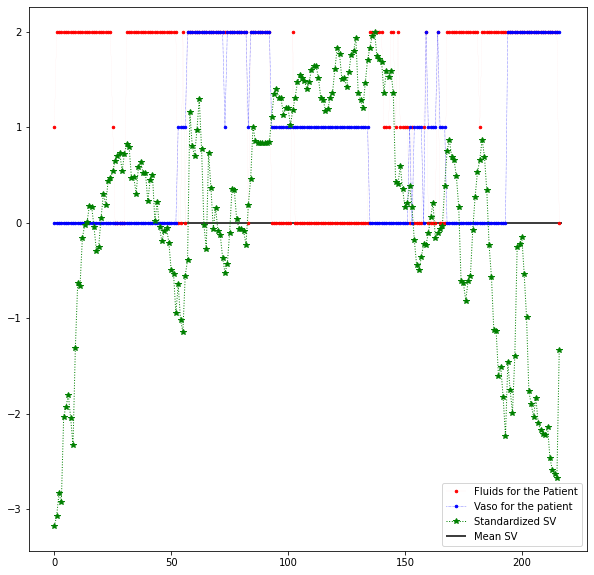

In [ ]:
dead_pats=list(df[df.Rewards==-15].Pat)
# pat=np.random.choice(dead_pats)
print('ICU ID :',pat)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV'.split():
  plot_feature_treat(pat,feature=feat)

DEAD =  True


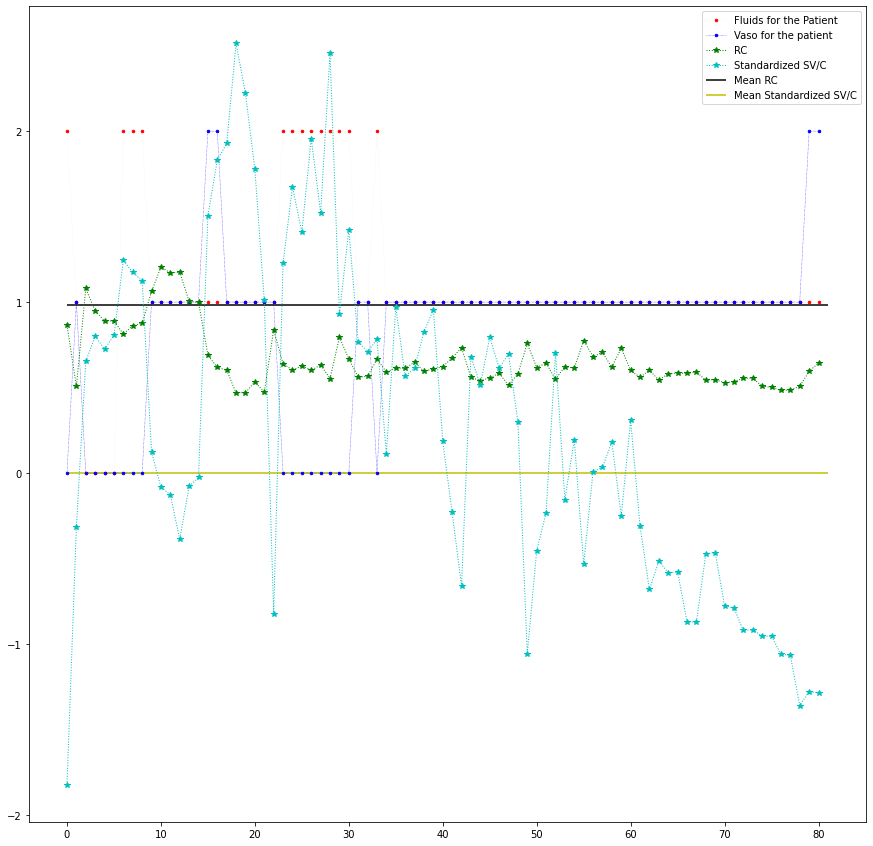

DEAD =  False


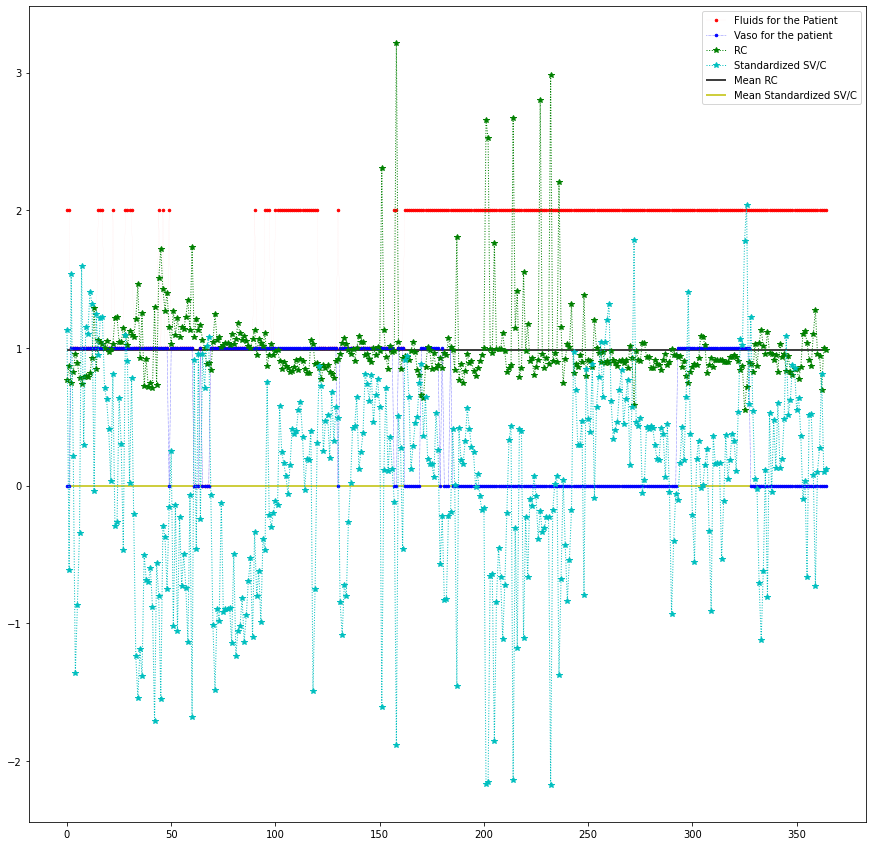

DEAD =  False


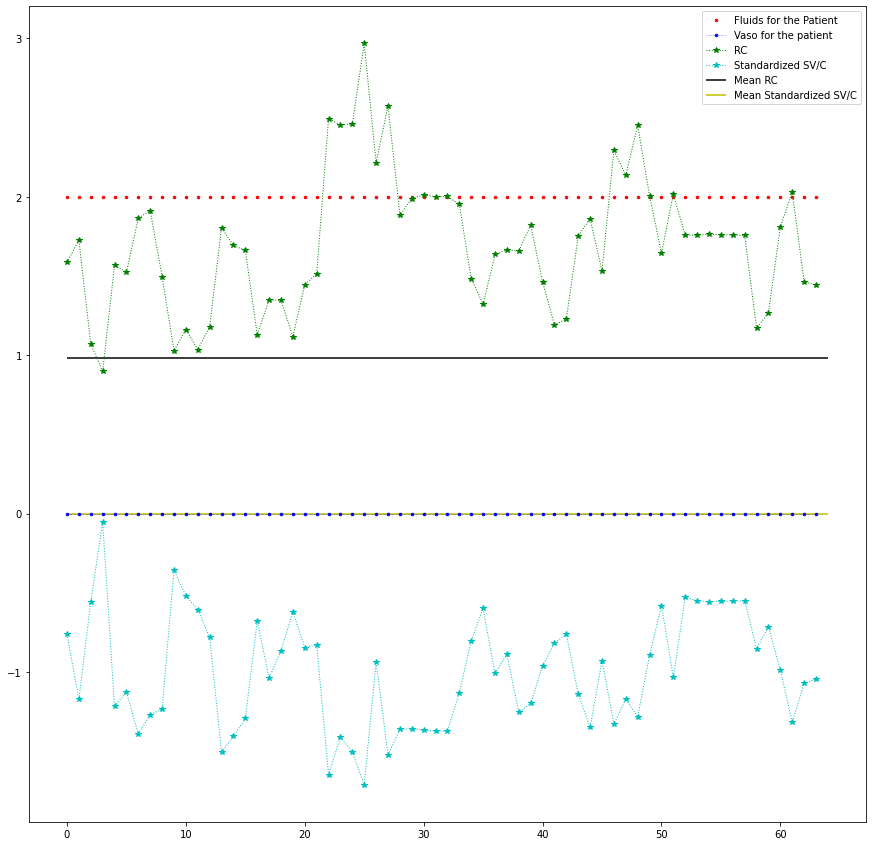

DEAD =  False


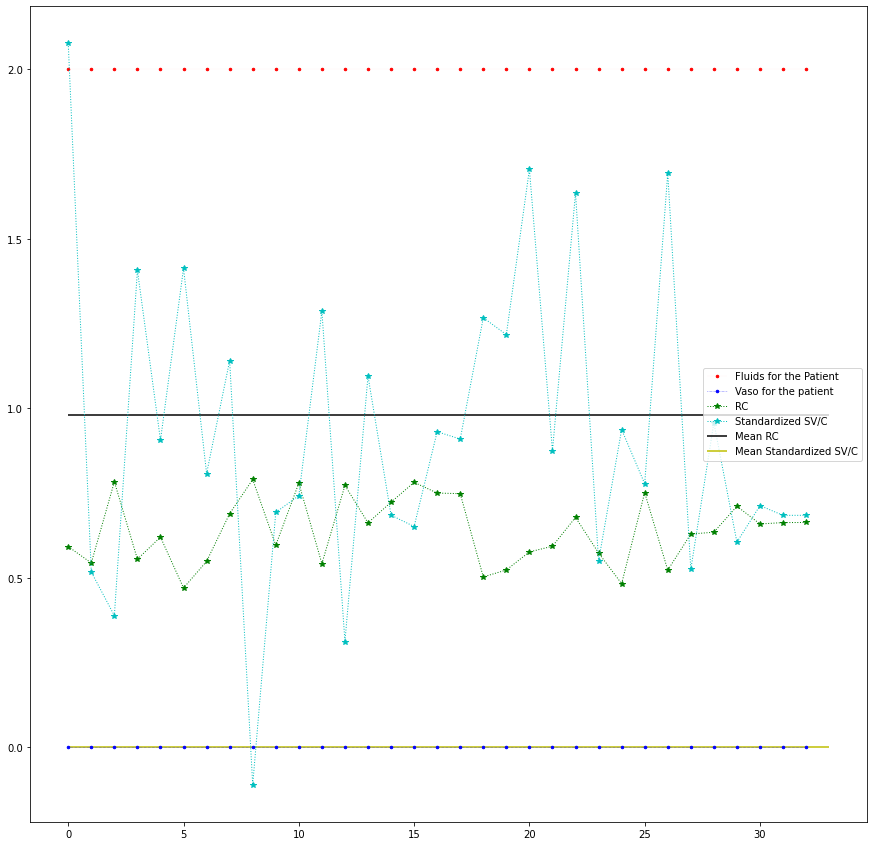

DEAD =  False


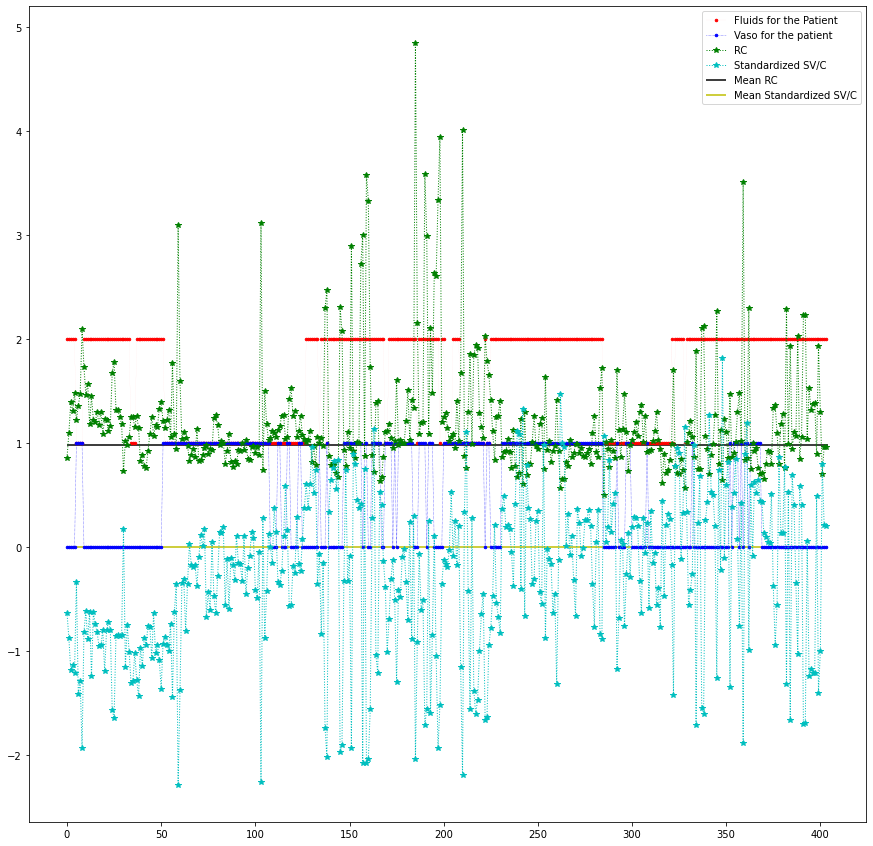

DEAD =  False


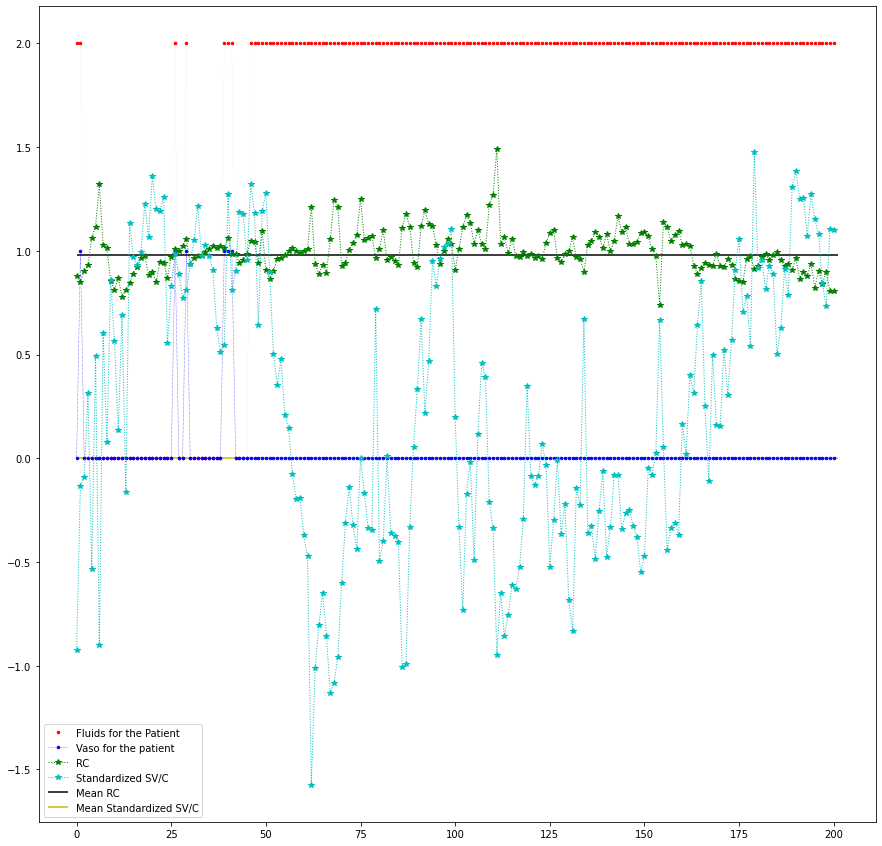

DEAD =  False


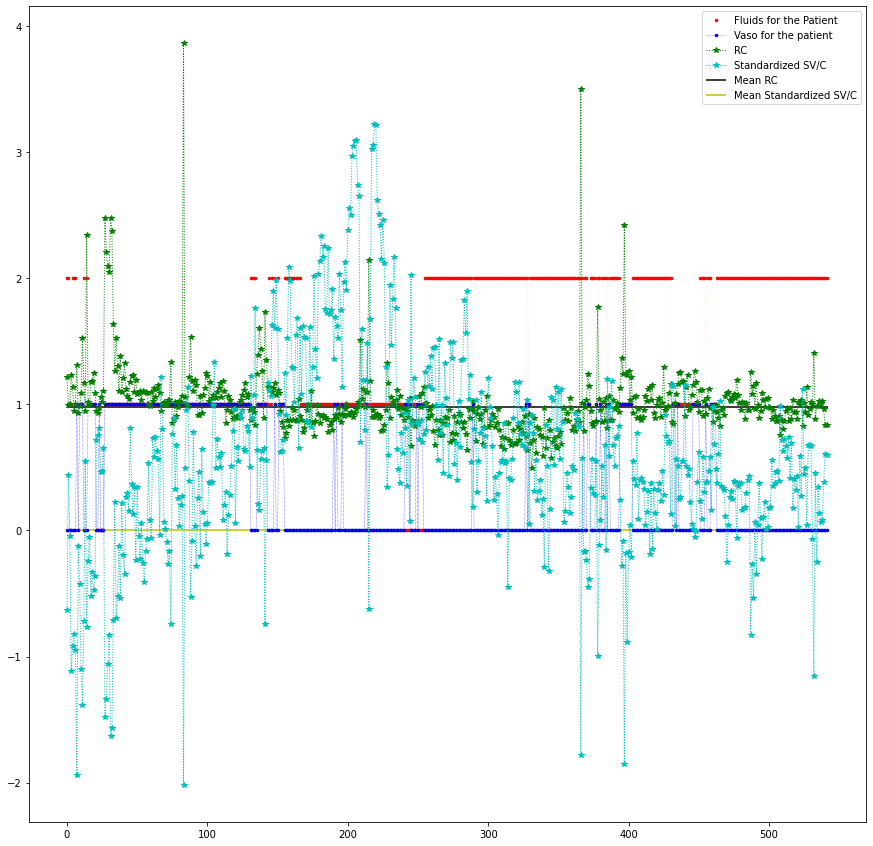

DEAD =  False


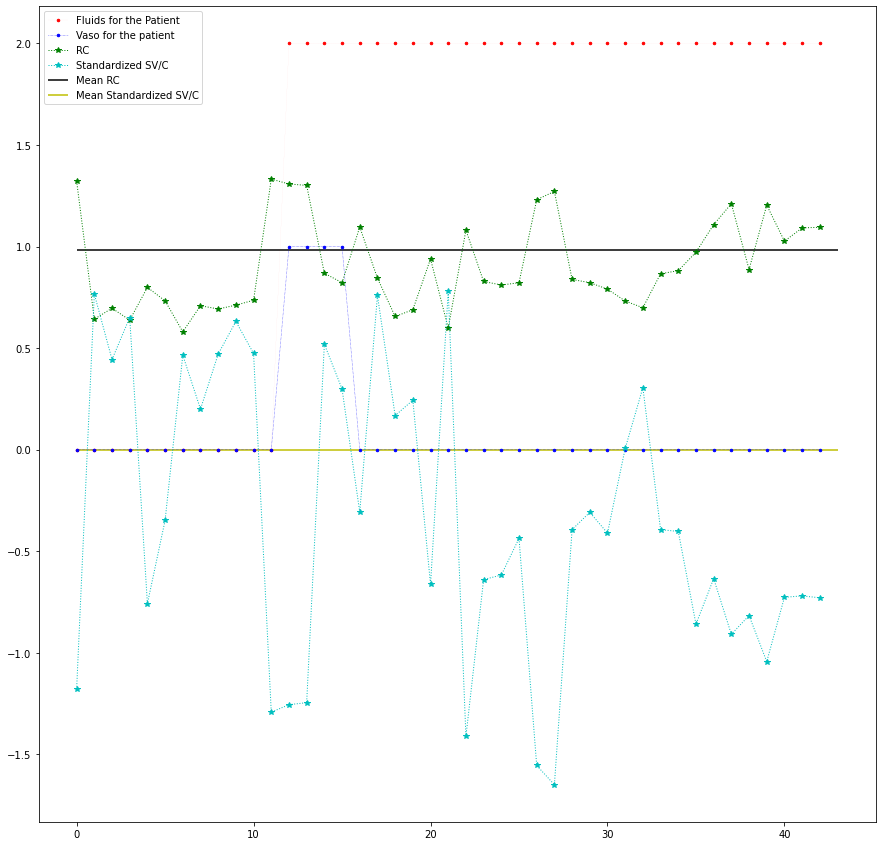

DEAD =  False


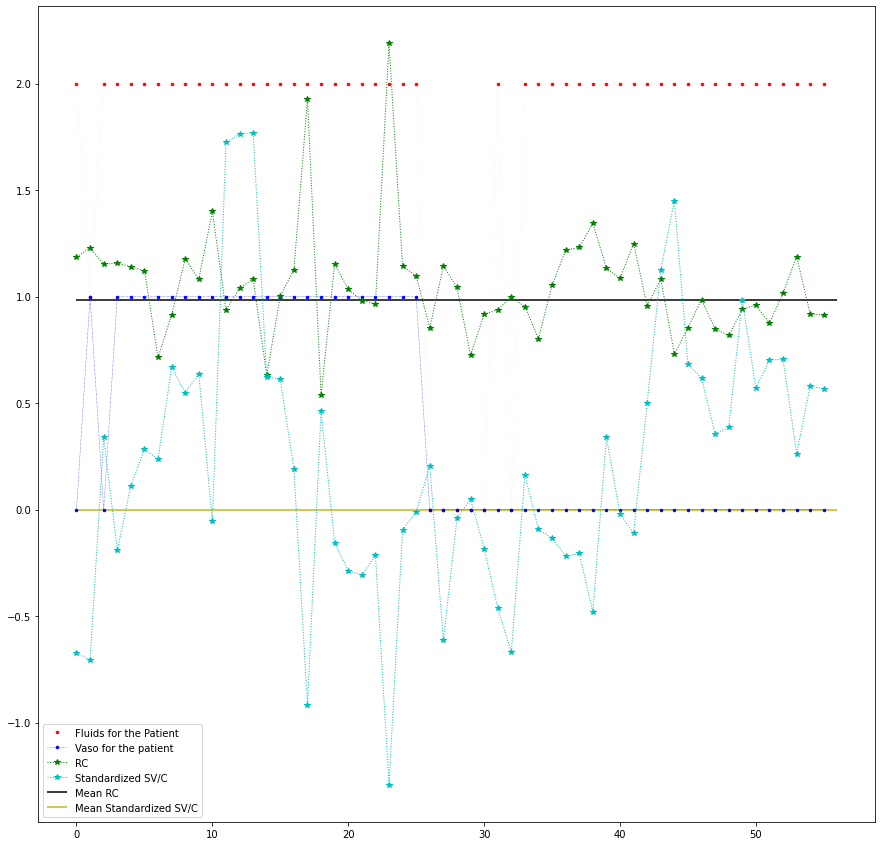

DEAD =  False


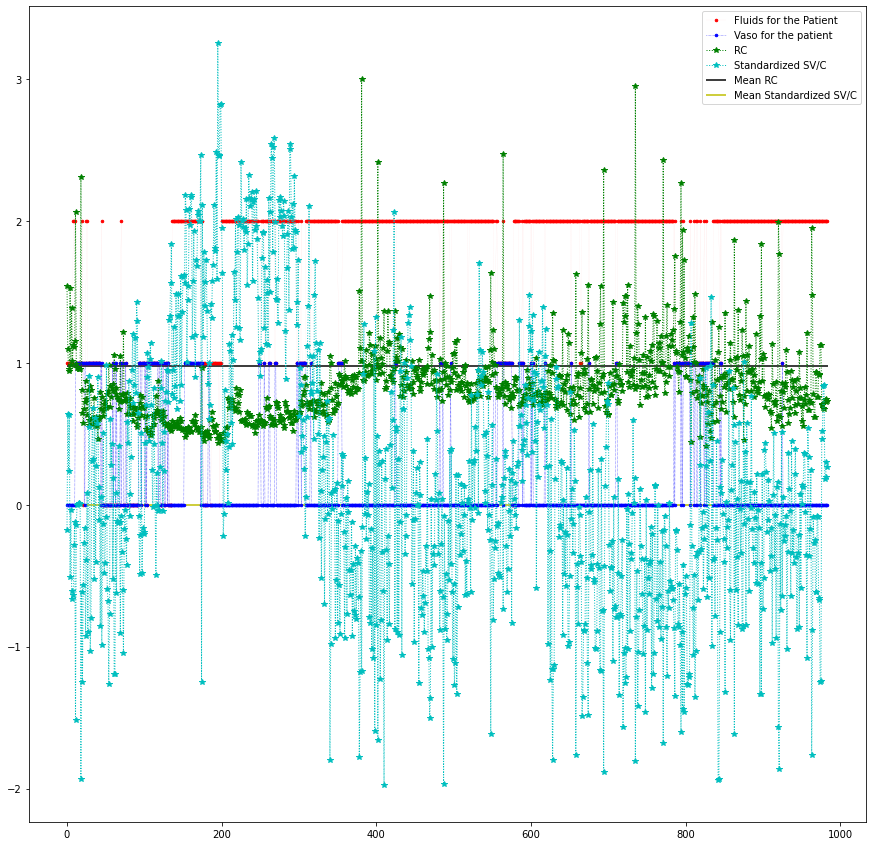

DEAD =  False


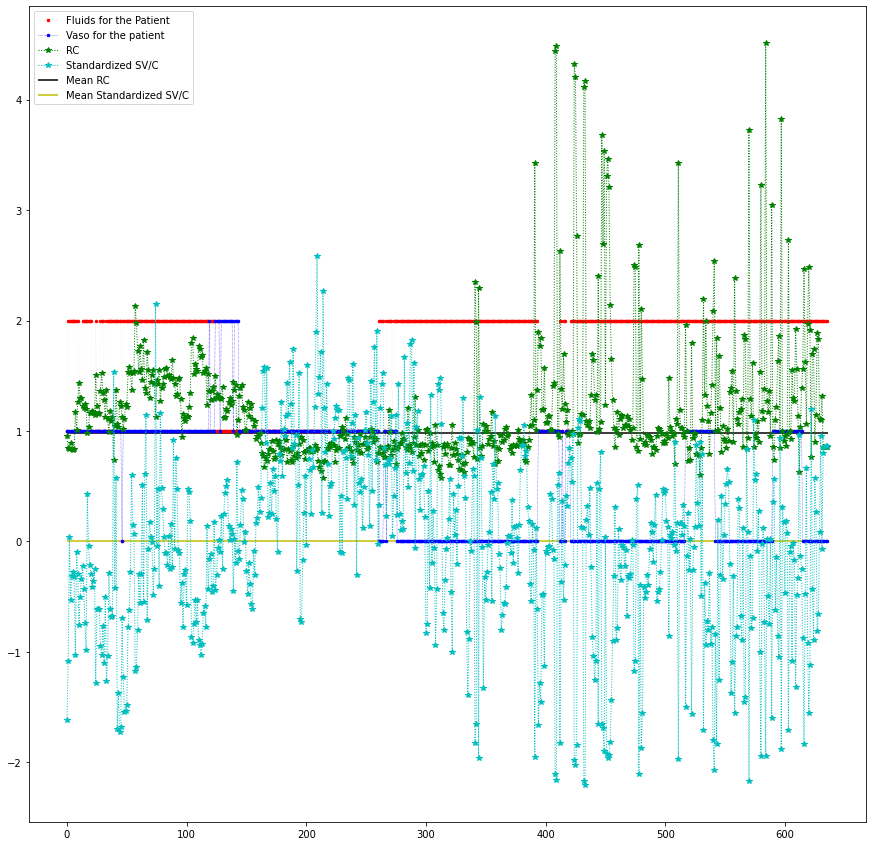

DEAD =  False


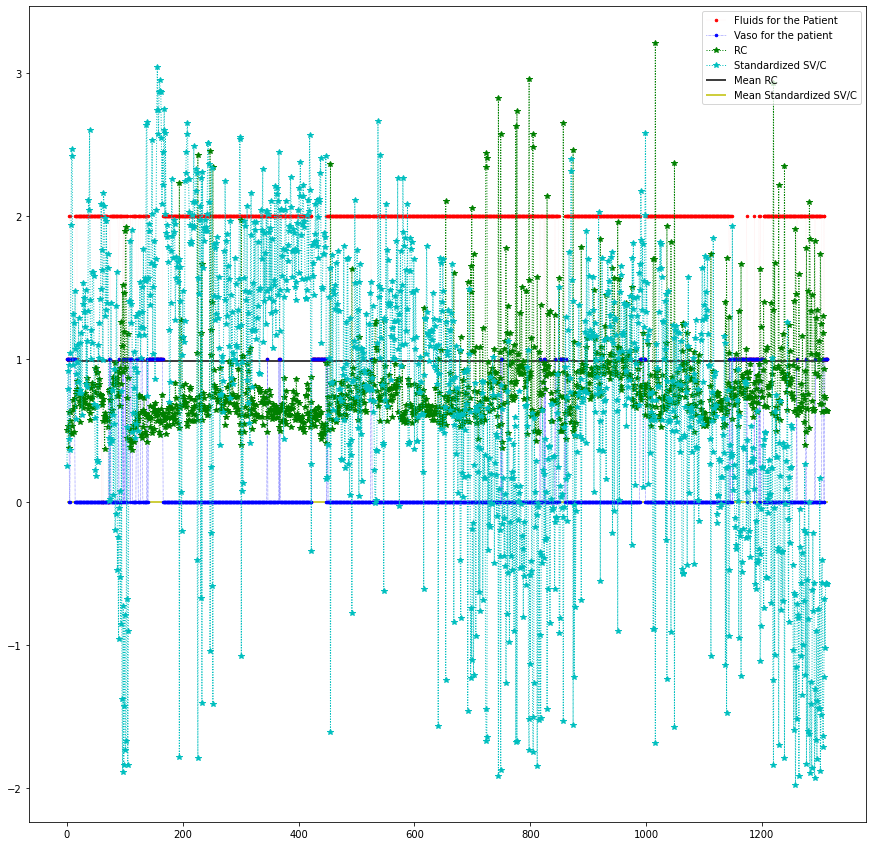

DEAD =  False


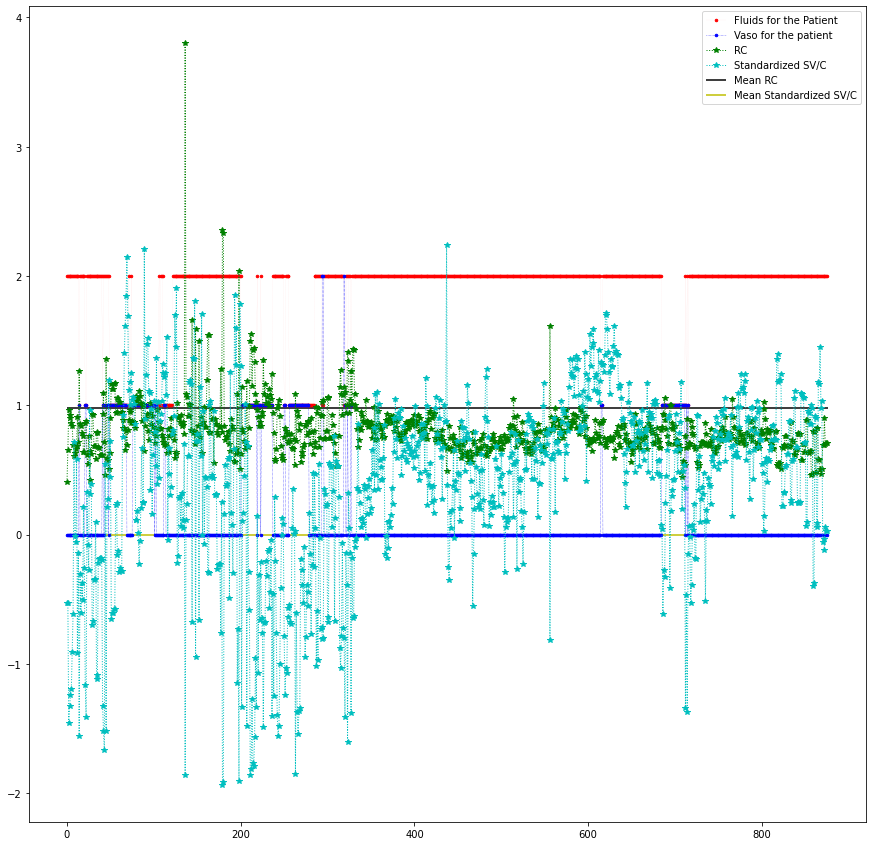

DEAD =  False


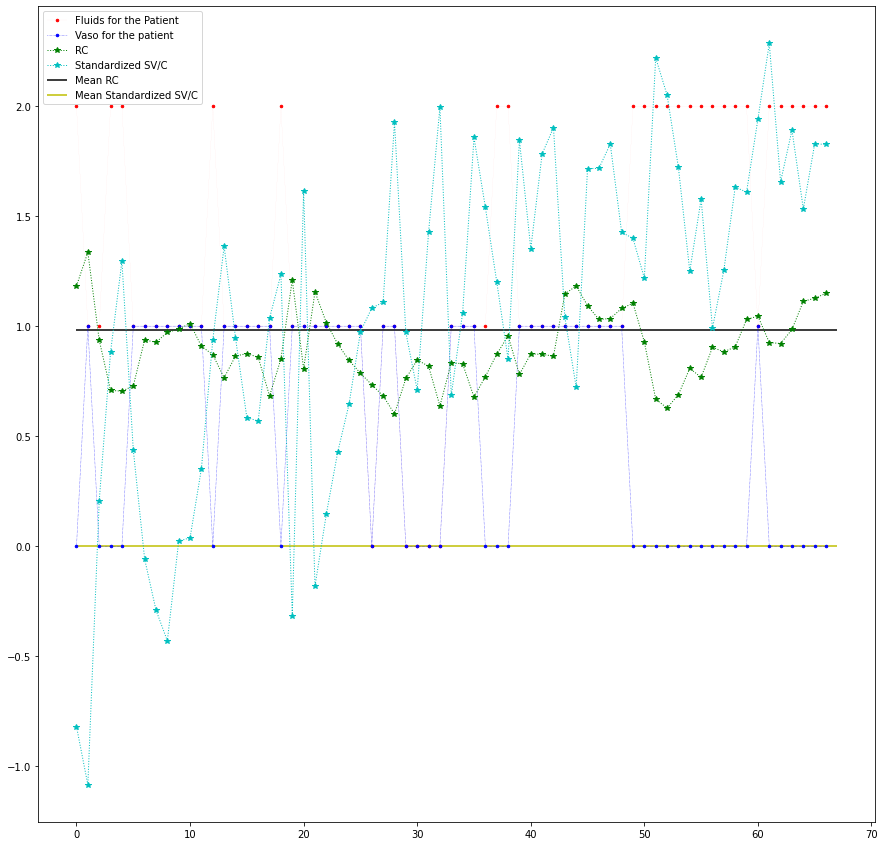

DEAD =  True


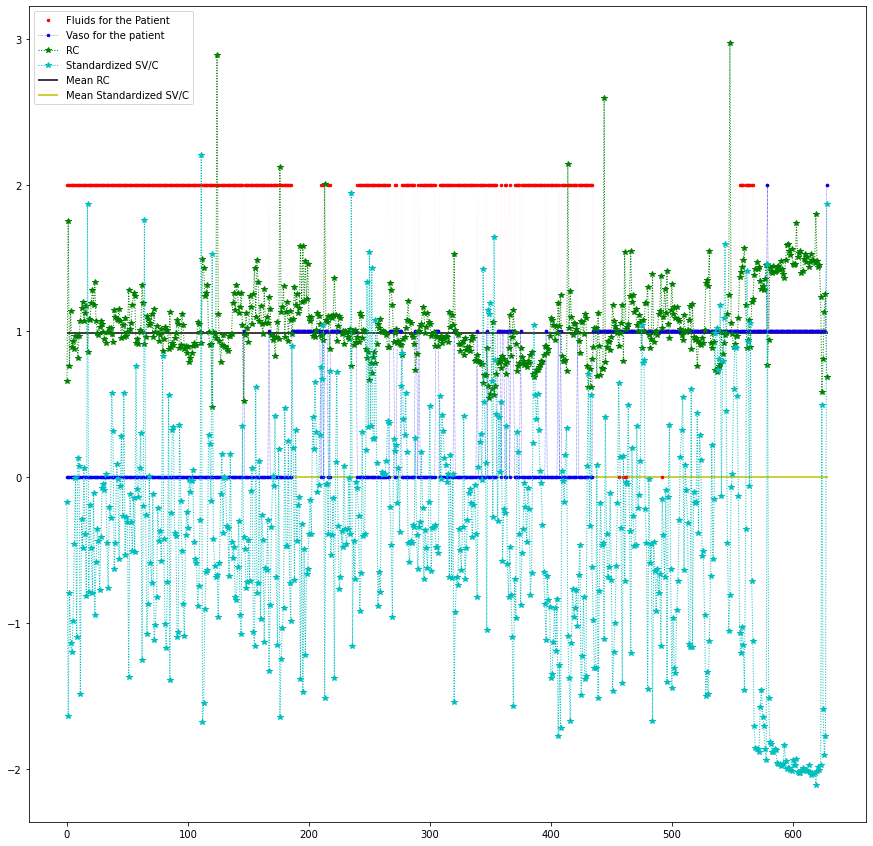

DEAD =  False


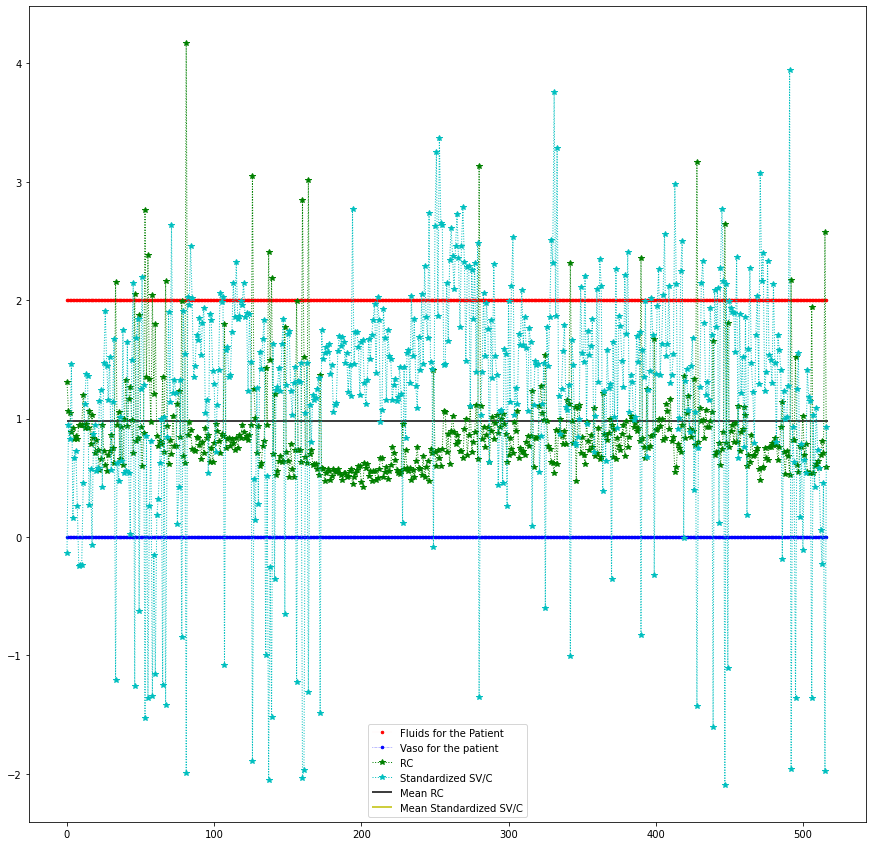

DEAD =  False


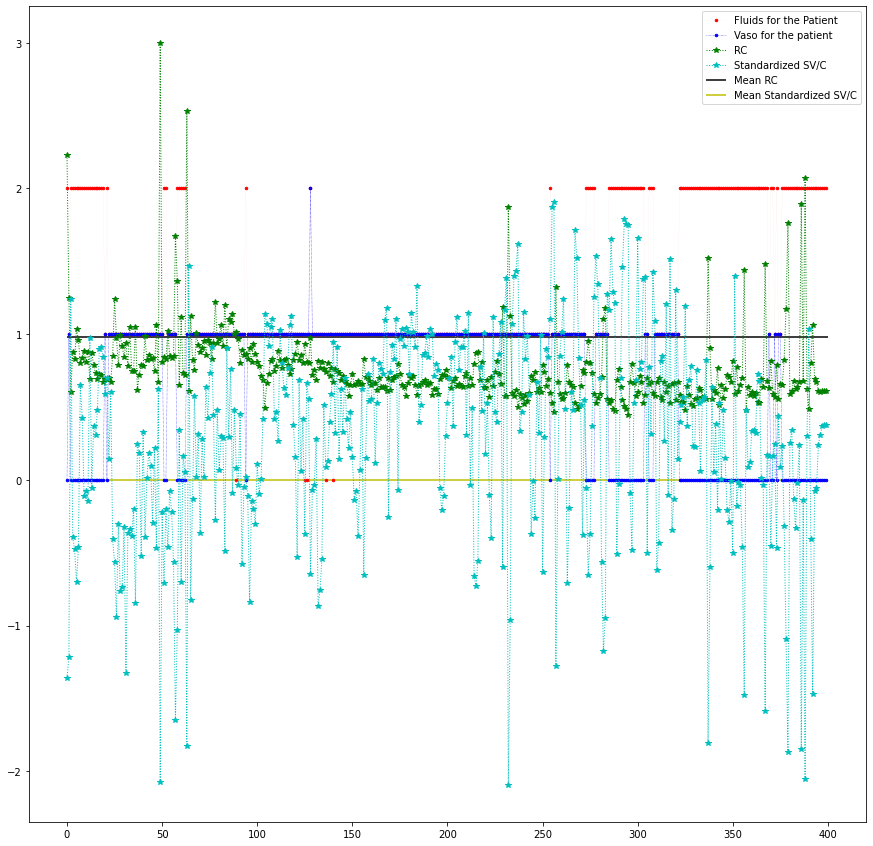

DEAD =  False


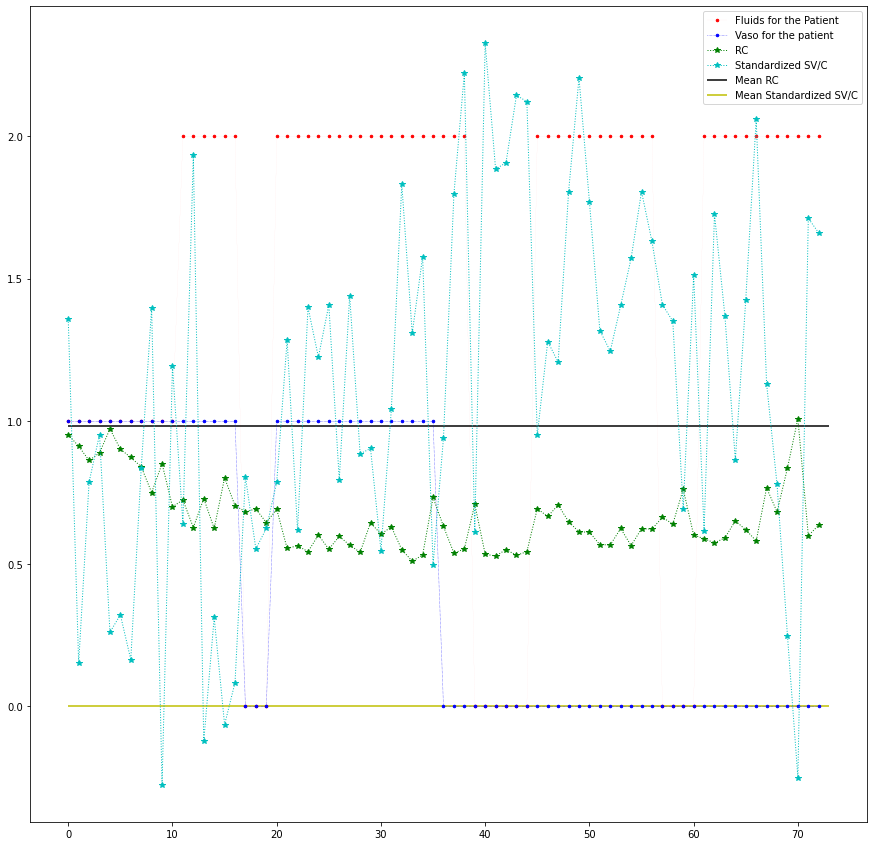

DEAD =  False


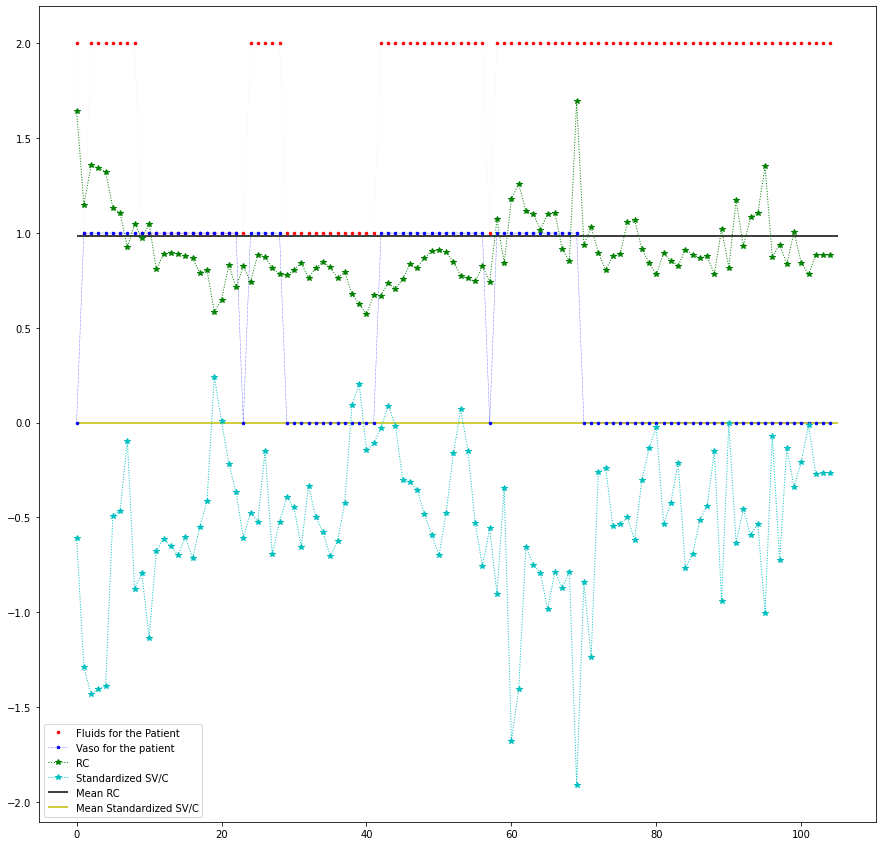

DEAD =  True


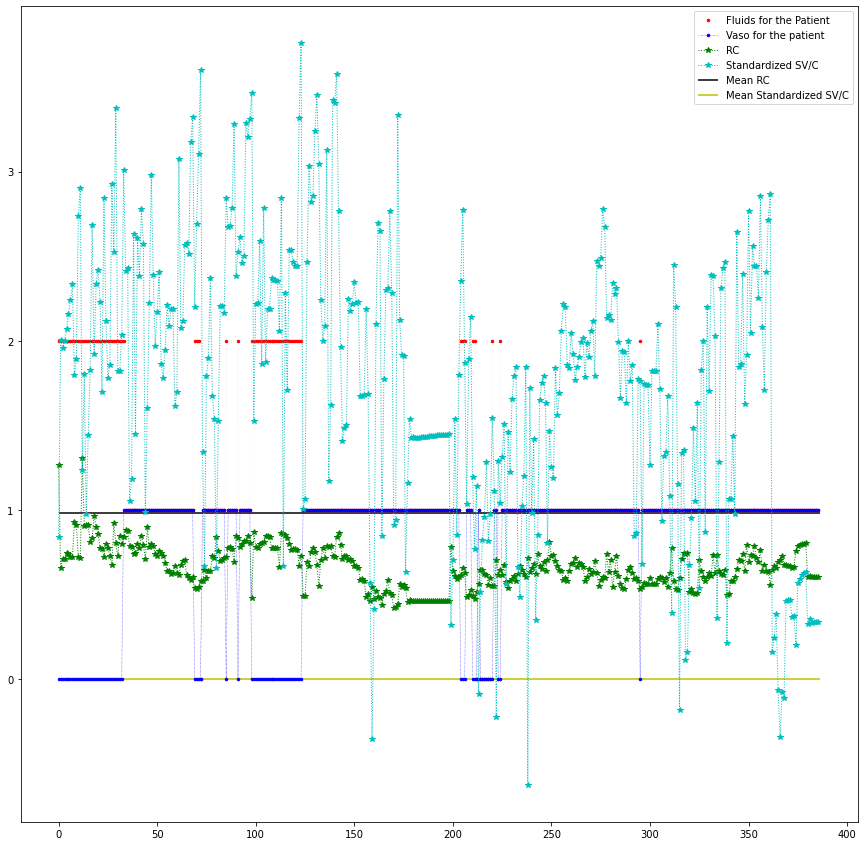

DEAD =  False


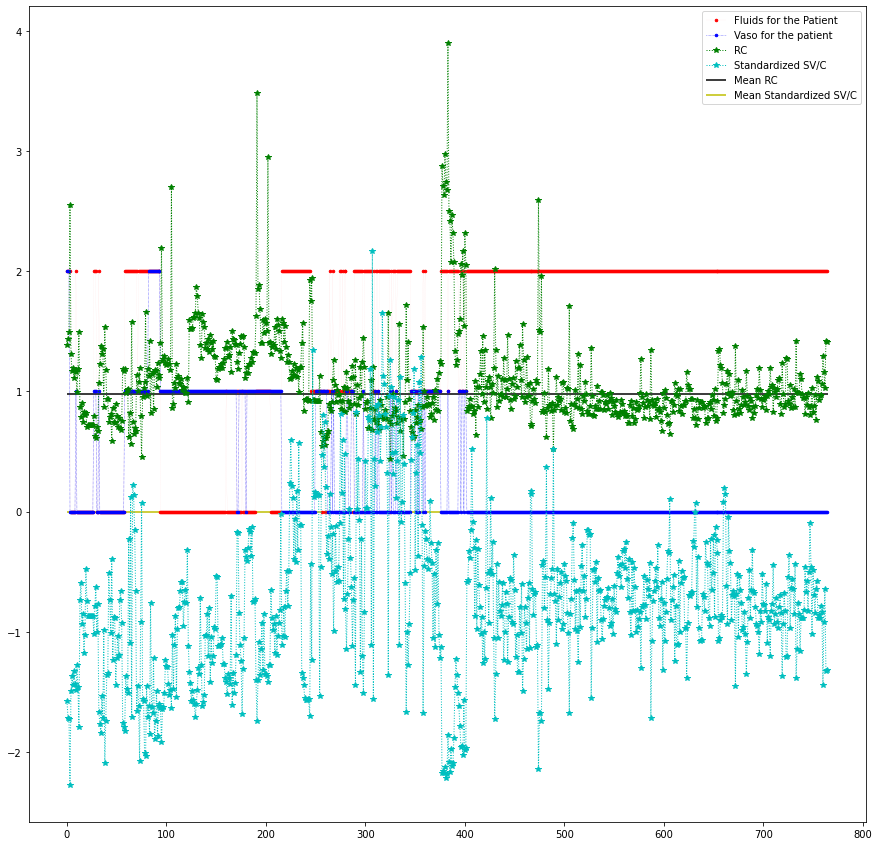

DEAD =  True


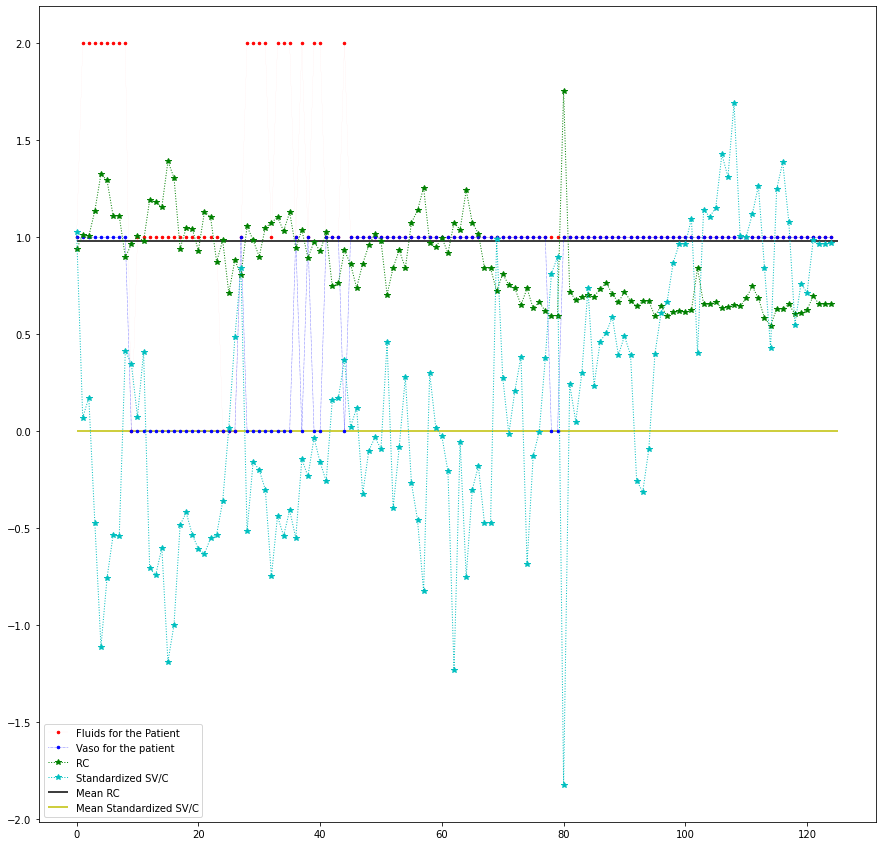

DEAD =  False


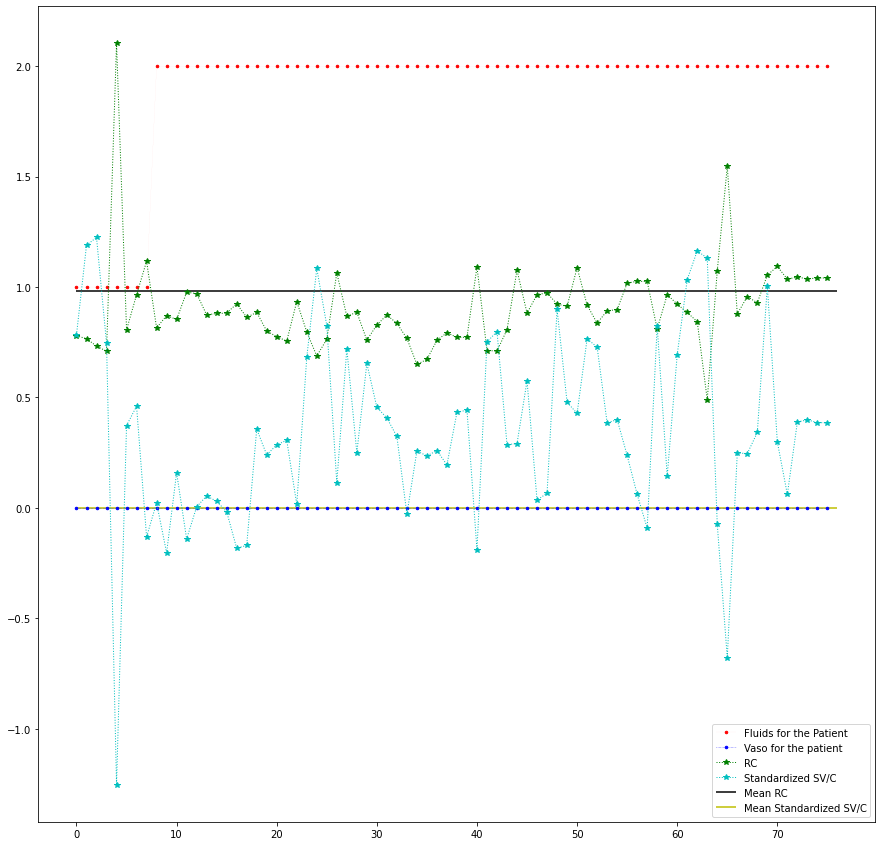

DEAD =  False


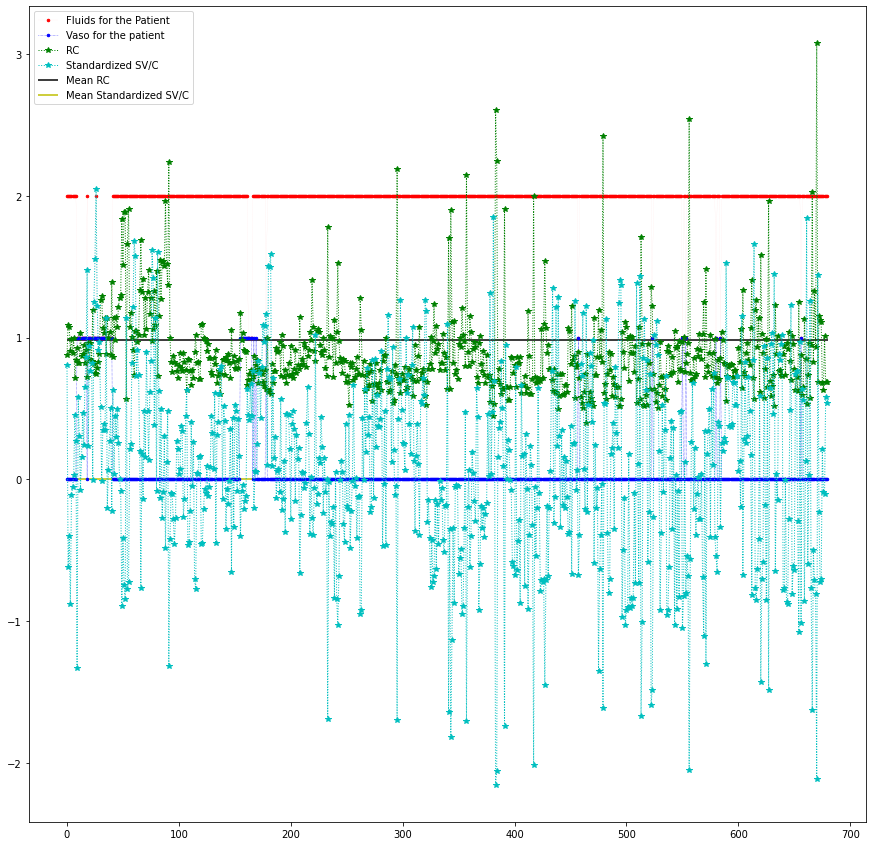

DEAD =  False


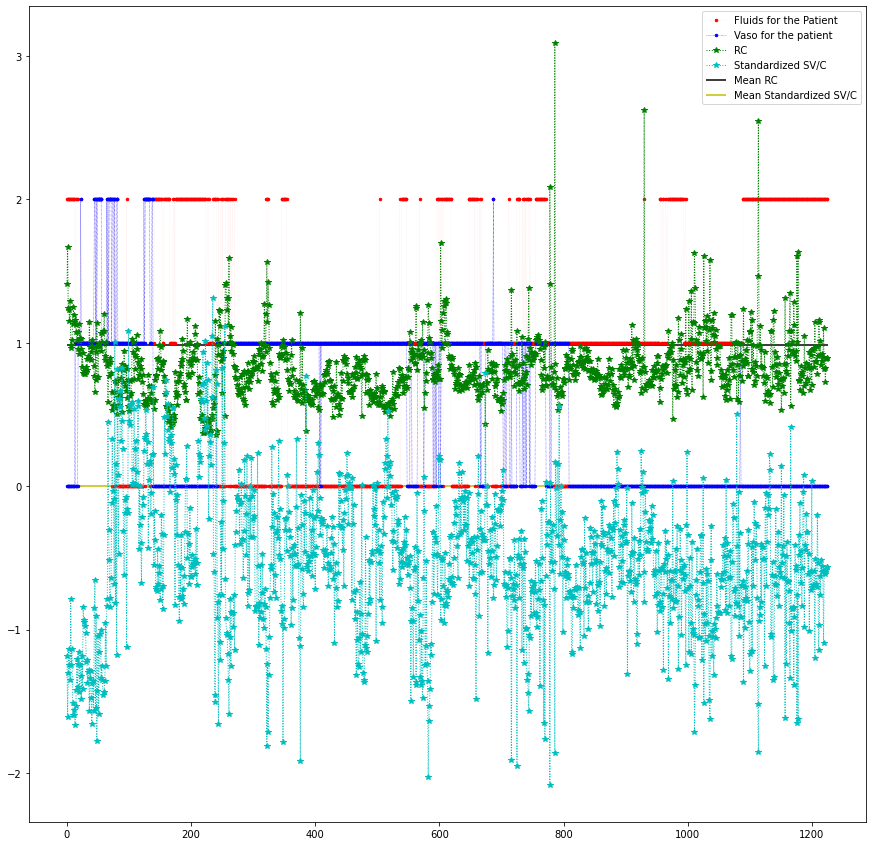

DEAD =  False


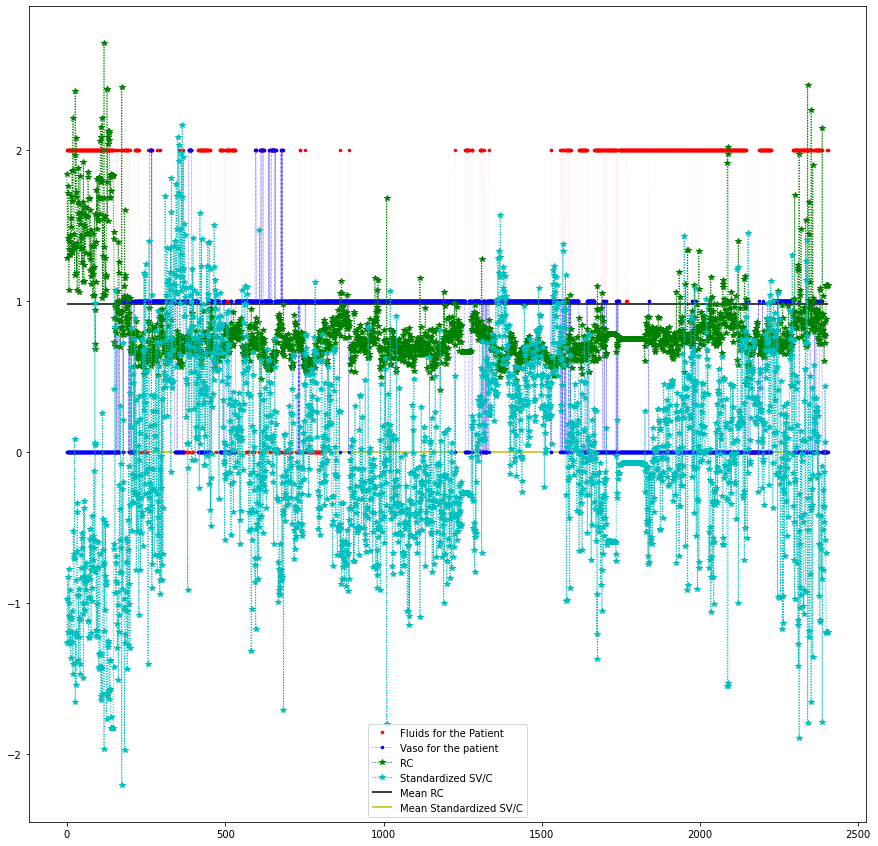

DEAD =  False


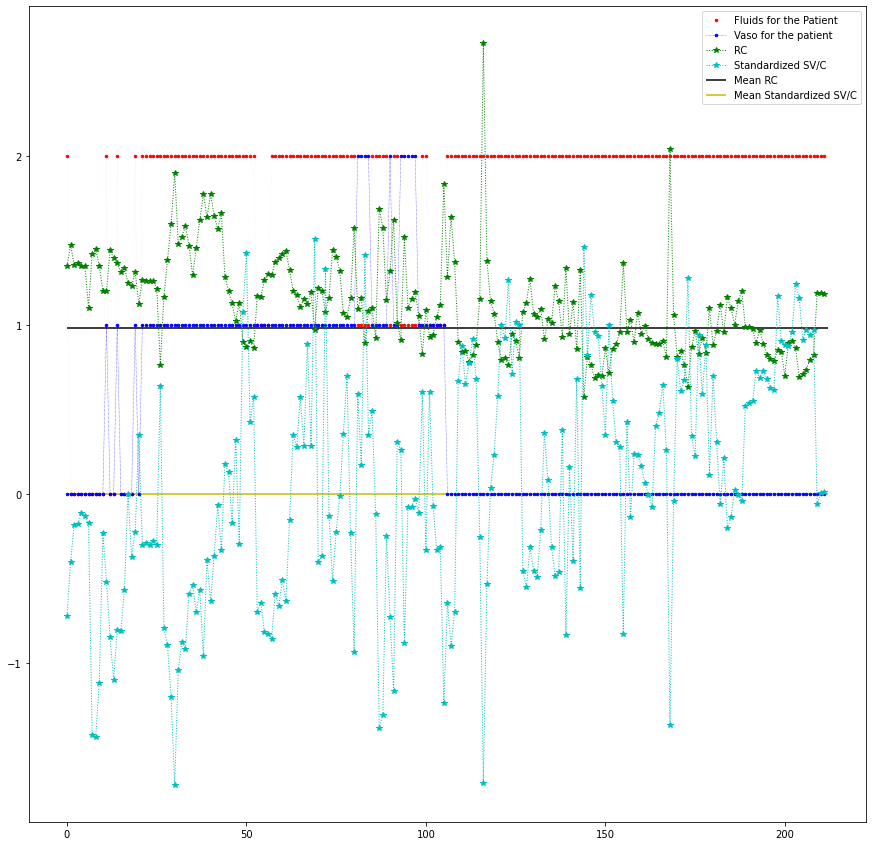

DEAD =  False


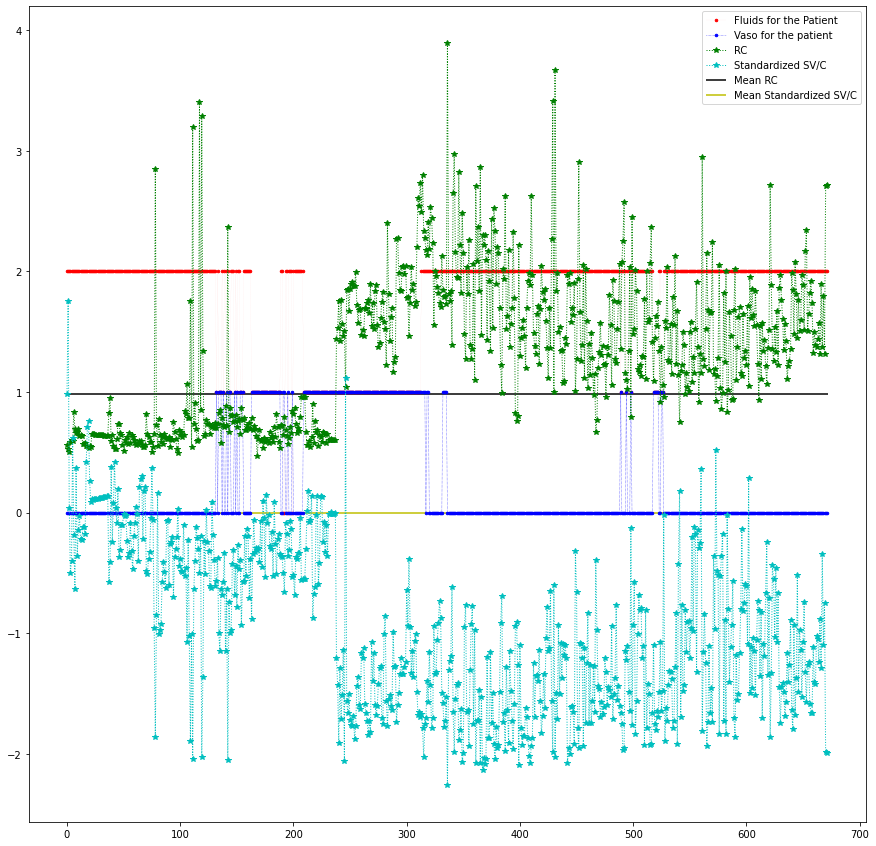

DEAD =  True


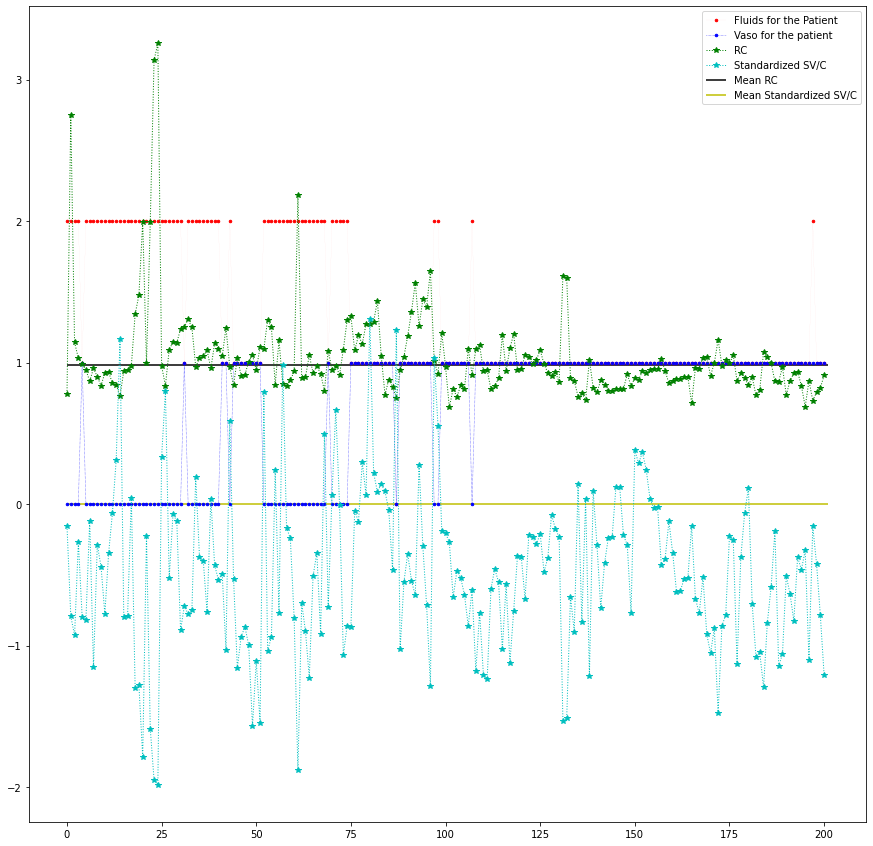

DEAD =  False


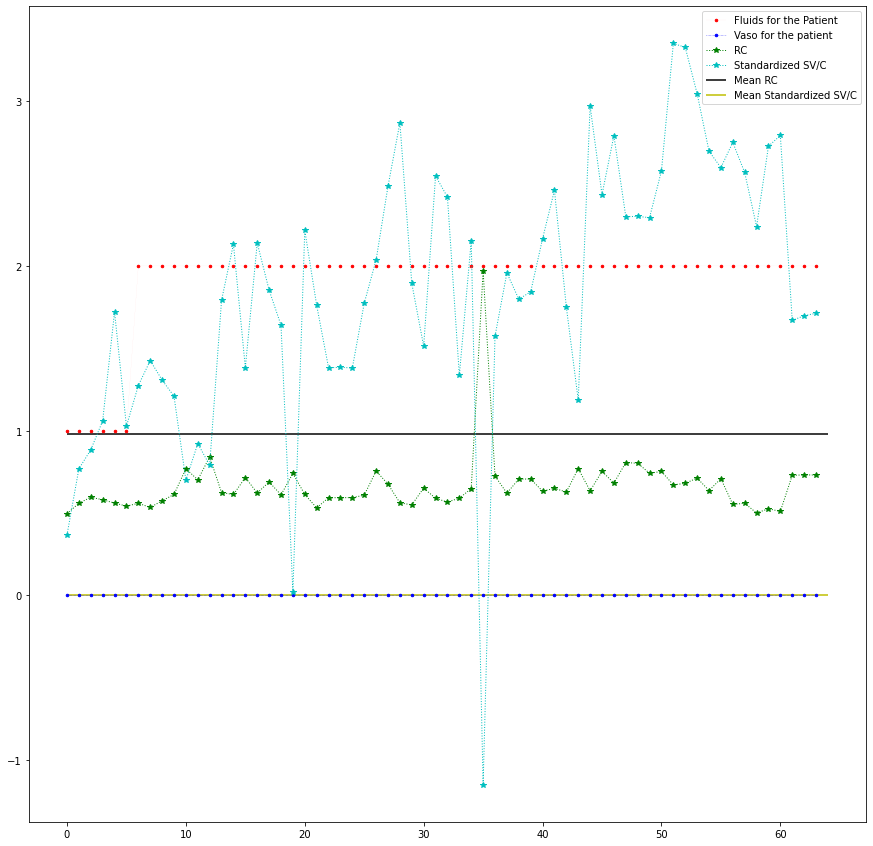

In [ ]:
dead_pats=list(df[df.Rewards==-15].Pat)
pats=np.random.choice(df.Pat,30)

for pat in pats:
  print('DEAD = ',df[df.Pat==pat].Rewards.iloc[-1]==-15)
  plot_feature_CV(pat)

### Uncertainty

In [ ]:
kl=pd.read_csv('avergae_KLs.csv')

In [ ]:
for i in range(9):
  
  df['kl_uncertainty_for_act_{}'.format(i)]=kl.iloc[:,i]

In [ ]:
df.sort_values(by='kl_uncertainty_for_act_0',ascending=False).head(50)

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7,kl_uncertainty_for_act_8
2271427,0.158148,0.552933,-0.360485,-1.104976,3.002090,-0.653502,-1.068572,-1.089970,1.0,4.0,4.0,1.790167,1.225155,-0.739970,29.148435,0.120865,0.552711,0.703222,0.758551,-1.156210,1.047409,0.182936,1.034517,-0.263514,-0.750170,-0.712092,-0.671695,-0.820397,0.699386,0.500377,-0.507820,0.146444,-0.449151,0.002439,0.672448,1.818827,0.568871,-0.806147,-1.342407,0.0,-0.654741,0.0000,5.000,0.125,249805,18.0,67.425949,-1.310232,1,0.927300,0,1,1,5.883047,5.065329,6.085520,4.019123,0.731758,1.952221,4.466539,0.927300,1.785277
2406069,2.567310,2.537469,0.896509,1.872906,-1.153666,-2.789563,-0.467784,-0.583062,1.0,0.0,0.0,-0.203927,-0.193091,-1.035373,-0.090318,1.146518,-0.974241,0.712485,1.047110,-0.246986,0.428985,0.279296,1.655127,-0.463694,-0.562945,0.086285,-0.325637,0.342286,0.406696,-0.715149,-0.155846,-0.377899,-0.061411,-0.404869,0.713568,2.964549,0.455157,-3.215289,1.047553,0.0,-0.886183,0.0000,0.000,-0.025,255010,2.0,63.439064,-2.156223,1,0.308765,0,0,0,5.070601,5.005234,5.316130,4.967169,0.266702,0.962743,5.177484,0.308765,0.981030
2406070,2.567310,2.537469,0.896509,1.872906,-1.153666,-2.789563,-0.467784,-0.583062,1.0,0.0,0.0,-0.203927,-0.193091,-1.035373,-0.090318,1.146518,-0.974241,0.712485,1.047110,-0.246986,0.428985,0.279296,1.655127,-0.463694,-0.562945,0.086285,-0.325637,0.342286,0.406696,-0.715149,-0.155846,-0.377899,-0.061411,-0.404869,0.724538,3.031991,0.454290,-3.305900,1.047553,0.0,-0.886183,0.0000,0.000,-15.000,255010,2.0,63.289112,-2.184587,1,0.318496,0,0,0,5.068189,5.020606,5.315051,4.989040,0.276119,1.000595,5.190400,0.318496,1.015251
2066630,-1.613294,1.486832,-1.783695,4.189037,-0.634197,-1.263805,-2.025384,-1.287100,3.0,0.0,0.0,-0.203927,-0.193091,-1.035373,-0.153605,0.830933,0.226566,0.193760,-0.159588,0.380507,-1.271680,0.086577,-0.496321,-0.084974,0.087317,0.330236,-0.092807,0.717884,0.636544,-0.482130,0.084501,0.496270,0.212635,0.003956,0.400901,1.998394,0.482478,-2.058482,0.167041,0.0,-0.994190,0.0000,0.000,-0.025,242153,4.0,65.353462,-1.546030,2,1.494144,0,0,0,5.047866,5.260921,5.448658,5.276970,2.064192,3.248958,5.238631,1.494144,3.102567
2066631,-1.613294,1.486832,-1.783695,4.189037,-0.634197,-1.263805,-2.025384,-1.287100,3.0,0.0,0.0,-0.203927,-0.193091,-1.035373,-0.153605,0.830933,0.226566,0.193760,-0.159588,0.380507,-1.271680,0.086577,-0.496321,-0.084974,0.087317,0.330236,-0.092807,0.717884,0.636544,-0.482130,0.084501,0.496270,0.212635,0.003956,0.394765,2.001844,0.478057,-2.079564,0.167041,0.0,-0.994190,0.0000,40.000,-15.000,242153,4.0,65.318573,-1.550013,2,1.516075,0,1,1,5.038844,5.256970,5.440545,5.272007,2.092167,3.276723,5.233501,1.516075,3.125776
2271426,0.547866,0.903145,0.138158,-1.104976,3.002090,-0.348350,-0.556789,-1.089970,1.0,4.0,4.0,1.790167,1.225155,-0.739970,29.148435,0.120865,0.552711,0.703222,0.758551,-1.156210,1.047409,0.182936,1.034517,-0.263514,-0.750170,-0.712092,-0.671695,-0.820397,0.699386,0.500377,-0.507820,0.146444,-0.449151,0.002439,0.685186,1.577924,0.529285,-1.003150,-1.342407,0.0,-0.654741,0.0000,5.000,-0.025,249805,18.0,67.099930,-1.015868,1,0.680520,0,1,1,4.645400,3.550377,4.449006,2.639632,0.551241,1.387349,3.219156,0.680520,1.314983
2577708,2.850741,3.179525,1.831465,0.549403,-1.153666,-1.263805,0.422274,-0.371852,0.0,1.0,0.0,-0.203927,1.483018,-1.429243,-0.248536,0.278658,-0.047693,-0.278650,0.024040,1.270523,0.892803,-0.106142,0.703525,0.456054,-0.329982,-0.020164,-0.404399,0.426446,0.601392,-0.148791,0.551409,0.500092,0.027259,-0.549567,0.744942,2.162377,0.389447,-3.437159,1.424915,0.0,

In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,0.078759,0,0,0,0.138073,0.133364,0.132941,0.121833,0.143090,0.135532,0.104093,0.078759
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,0.107538,0,0,0,0.152918,0.159419,0.155522,0.136692,0.151703,0.142129,0.121128,0.107538
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,0.101959,0,0,0,0.126858,0.132036,0.128167,0.113287,0.122830,0.115240,0.106603,0.101959
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,0.123083,0,0,0,0.143337,0.148115,0.145666,0.133475,0.141518,0.134463,0.126753,0.123083
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,0.126077,0,0,0,0.143190,0.147734,0.145441,0.134840,0.142826,0.137033,0.128764,0.126077


In [ ]:
pats=np.random.choice(df.Pat,30)
pats=[242153]
for pat in pats:
  print('DEAD = ',df[df.Pat==pat].Rewards.iloc[-1]==-15)
  
  plt.figure(figsize=(10,10))
  pat_df=df[df.Pat==pat]

  legends=['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
  colors=['cornflowerblue','royalblue','midnightblue','lightcoral','indianred','darkred','orange','chocolate','purple']
  

  for k in range(9):
    treat=pat_df['kl_uncertainty_for_act_{}'.format(k)]
    plt.plot(np.arange(treat.shape[0]),treat,color=colors[k],linestyle='dotted',linewidth=0.05,marker=".",markersize=5,label=legends[k])
  
  plt.legend()  
  plt.show()
 
    
  
  


In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,0.078759,0,0,0,0.138073,0.133364,0.132941,0.121833,0.143090,0.135532,0.104093,0.078759
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,0.107538,0,0,0,0.152918,0.159419,0.155522,0.136692,0.151703,0.142129,0.121128,0.107538
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,0.101959,0,0,0,0.126858,0.132036,0.128167,0.113287,0.122830,0.115240,0.106603,0.101959
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,0.123083,0,0,0,0.143337,0.148115,0.145666,0.133475,0.141518,0.134463,0.126753,0.123083
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,0.126077,0,0,0,0.143190,0.147734,0.145441,0.134840,0.142826,0.137033,0.128764,0.126077


In [ ]:
df.describe()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7,kl_uncertainty_for_act_8
count,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06,2.596604e+06
mean,1.165914e-14,-1.845753e-15,5.657745e-14,-5.892341e-15,-5.327978e-15,1.109098e-14,-1.478347e-16,8.526322e-11,1.212766e+00,2.094336e+00,3.815326e-01,2.888188e-14,-1.325871e-01,2.470339e-02,3.432350e-03,1.893232e-01,-2.306698e-02,-1.200759e-01,-1.814888e-01,-1.223924e-02,-6.377590e-02,1.618775e-01,1.454239e-01,1.128904e-01,9.760083e-02,1.357634e-01,-4.076781e-01,1.819652e-01,1.582296e-01,-5.263733e-01,-5.834060e-02,1.757722e-01,8.533740e-02,-4.230188e-02,8.087617e-01,1.235423e+00,6.429658e-01,-1.296291e-15,-7.158685e-12,5.846432e-01,-4.243637e-12,4.958181e-02,5.798182e+01,6.222447e-02,2.501842e+05,6.441709e+00,6.876004e+01,-9.552767e-15,3.182118e-01,1.090862e-01,2.686008e-01,6.402362e-01,1.446039e+00,1.210628e-01,1.154771e-01,1.223204e-01,1.139530e-01,1.133243e-01,1.174757e-01,1.092918e-01,1.090862e-01,1.182607e-01
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.102730e+00,1.360312e+00,9.517077e-01,1.000000e+00,9.508876e-01,1.004135e+00,9.208529e-01,9.641469e-01,6.962480e-01,8.041106e-01,8.048169e-01,9.555941e-01,8.338930e-01,9.319751e-01,1.056101e+00,7.952830e-01,4.279733e-01,4.147424e-01,3.363828e-01,3.687238e-01,3.756027e-01,3.371967e-01,3.535843e-01,3.661100e-01,4.222084e-01,3.538145e-01,2.025886e-01,4.176860e-01,1.348425e-01,1.000000e+00,1.000000e+00,4.927835e-01,1.000000e+00,2.132757e-01,6.897391e+02,1.266229e+00,2.857761e+04,3.850081e+00,1.654899e+00,1.000000e+00,4.899099e-01,1.040500e-01,6.141058e-01,7.423782e-01,2.108744e+00,1.305651e-01,1.166242e-01,1.325781e-01,1.148613e-01,1.034015e-01,1.105341e-01,1.091153e-01,1.040500e-01,1.062049e-01
min,-4.205978e+00,-5.030034e+00,-4.873410e+00,-3.392983e+00,-1.673136e+00,-2.949032e+01,-5.404932e+00,-2.782923e+01,0.000000e+00,0.000000e+00,0.000000e+00,-8.686252e-01,-3.287447e+00,-3.989402e+00,-9.130530e-01,-6.585325e+00,-1.908202e+00,-3.974561e+00,-3.832146e+00,-1.469957e+00,-4.209193e+00,-7.622187e+00,-1.241053e+00,-1.210313e+00,-9.992068e-01,-9.780218e-01,-9.875341e-01,-9.621983e-01,-9.735907e-01,-9.571657e-01,-9.810123e-01,-9.634029e-01,-9.854658e-01,-9.828928e-01,1.269579e-01,3.996551e-01,2.565322e-01,-6.189589e+00,-3.040536e+00,0.000000e+00,-3.192893e+00,0.000000e+00,0.000000e+00,-1.500000e+01,2.000010e+05,0.000000e+00,5.851690e+01,-2.858170e+00,0.000000e+00,6.121594e-03,0.000000e+00,0.000000e+00,0.000000e+00,4.819455e-03,4.900003e-03,5.573712e-03,4.814132e-03,4.897309e-03,6.121382e-03,5.606451e-03,6.121594e-03,5.894517e-03
25%,-6.921440e-01,-7.311784e-01,-6.617490e-01,-7.741007e-01,-6.341967e-01,-3.483501e-01,-7.348009e-01,-6.534669e-01,1.000000e+00,1.000000e+00,0.000000e+00,-8.686252e-01,-7.088172e-01,-6.415021e-01,-5.333289e-01,-4.314